## Table of Contents 

### Data Preparation 

 - [Initial Data Cleaning](#Initial-Data-Cleaning)

 - [Additional Data Preprocessing](#ADDITIONAL-DATA-PREPROCESSING)

### First Iteration of Training Models -- No Preprocessing, Naive Run
 - [First Iteration of Training Models -- No Preprocessing, Naive Run](#First-Iteration-of-Training-Models)

 - [Random Forests -- Naive Approach](#Naive-Random-Forests)

 - [XGBoost -- Naive Approach](#Naive-XGBoost)

 - [LightGBM -- Naive Approach](#lightgbm----naive)

 - [ExtraTrees -- Naive Approach](#extratrees----naive)

 - [KNN -- Naive Approach](#knn----naive)

 - [MLP -- Naive Approach](#mlp----naive)


### Second Iteration of Training Models -- Preprocessed Data, Smaller Feature Set
 - [Second Iteration of Training Models -- Preprocessed Data, Smaller Feature Set](#second-iteration-of-training-models----preprocessed-data-smaller-feature-set)
 
 - [Random Forests -- Preprocessed Data, Smaller Feature Set](#Random-Forests-using-Preprocessed-Data)
 
 - [XGBoost -- Preprocessed Data, Smaller Feature Set](#XGBoost-using-Preprocessed-Data)
 
 - [LightGBM -- Preprocessed Data, Smaller Feature Set](#lightgbm----preprocessed-data)
 
 - [ExtraTrees -- Preprocessed Data, Smaller Feature Set](#extratrees----preprocessed-data)
 
 - [KNN -- Preprocessed Data, Smaller Feature Set](#knn----preprocessed-data)
 
 - [MLP -- Preprocessed Data, Smaller Feature Set](#mlp----preprocessed-data)

### Third Iteration of Training Models -- Preprocessed Data, Smaller Feature Set, Physical Metadata
 - [Third Iteration of Training Models -- Preprocessed Data, Smaller Feature Set, Physical Metadata](#third-iteration-of-training-models----preprocessed-data-smaller-feature-set-physical-metadata)
 
 - [Random Forests -- Preprocessed Data + Metadata](#Random-Forests-using-Preprocessed-data-and-Metadata)

 - [XGBoost -- Preprocessed Data + Metadata](#xgboost----preprocessed--metadata)

 - [LightGBM -- Preprocessed Data + Metadata](#lightgbm----preprocessed--metadata)

 - [ExtraTrees -- Preprocessed Data + Metadata](#extratrees----preprocessed--metadata)

 - [KNN -- Preprocessed Data + Metadata](#knn----preprocessed--metadata)

 - [MLP -- Preprocessed Data + Metadata](#mlp----preprocessed--metadata)
 


# Initial Data Cleaning

In [ ]:
import pandas as pd
import re

from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestRegressor
import numpy as np

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestRegressor

from scipy.stats import spearmanr
from sklearn.metrics import mean_squared_error, mean_absolute_error

import matplotlib.pyplot as plt

from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor



,Unnamed: 0,Rk,Pk,Tm,Player,College,Yrs,G,TOTMP,TOTPTS,...,WS/48,BPM,VORP,DraftYr,MPG,PPG,RPG,APG,playerurl,DraftYear
0,1,1,1,BRK,Derrick Coleman,Syracuse,15.0,781.0,25903.0,12884.0,...,0.119,1.4,22.3,1990,33.2,16.5,9.3,2.5,https://www.sports-reference.com/cbb/players/d...,1990
1,2,2,2,OKC,Gary Payton,Oregon State,17.0,1335.0,47117.0,21813.0,...,0.148,3.3,62.5,1990,35.3,16.3,3.9,6.7,https://www.sports-reference.com/cbb/players/g...,1990
2,3,3,3,DEN,Mahmoud Abdul-Rauf,LSU,9.0,586.0,15628.0,8553.0,...,0.077,-0.8,4.5,1990,26.7,14.6,1.9,3.5,https://www.sports-reference.com/cbb/players/m...,1990
3,4,4,4,ORL,Dennis Scott,Georgia Tech,10.0,629.0,17983.0,8094.0,...,0.089,0.2,9.9,1990,28.6,12.9,2.8,2.1,https://www.sports-reference.com/cbb/players/d...,1990
4,5,5,5,CHA,Kendall Gill,Illinois,15.0,966.0,29481.0,12914.0,...,0.078,0.1,15.8,1990,30.5,13.4,4.1,3.0,https://www.sports-reference.com/cbb/players/k...,1990


In [ ]:
nba_plus_draft_position_dataset = pd.read_csv("draft-data-20-years.csv")

nba_plus_draft_position_dataset.head()

blank column: An index of each unique row number.

Rk and Pk: Corresponds to the pick with which a player was selected in the NBA draft.

Tm: The NBA team that drafted a player.

Player: The name of the player.

College: The college an NBA draft pick attended. For international prospects, players who were drafted out of the G-League, and players who were drafted directly out of high school, this column is blank.

Yrs: Years spent in the NBA. NA for players who did not play a single season.

G: Games played in the NBA. NA for players who did not play a single game.

TOTMP: Total minutes played in the NBA. NA for players who did not play a single minute.

TOTPTS: Total points scored in the NBA. NA for players who did not play in the NBA; 0 for players who did but failed to record a point.

TOTTRB: Total rebounds grabbed in the NBA. NA for players who did not play in the NBA; 0 for players who did but failed to record a rebound.

TOTAST: Total assists recorded in the NBA. NA for players who did not play in the NBA; 0 for players who did but failed to record an assist.

FG%: Field goal percentage in the NBA. NA for players who did not play in the NBA

3P%: Three point percentage in the NBA. NA for players who did not play in the NBA

FT%: Free throw percentage in the NBA. NA for players who did not play in the NBA

WS: Win shares in the NBA, using Basketball-Reference's Win Shares. NA for players who did not play in the NBA

WS/48: Win shares in the NBA per 48 minutes, using Basketball-Reference's Win Shares. NA for players who did not play in the NBA

BPM: Box plus-minus in the NBA, using Basketball-Reference. NA for players who did not play in the NBA

VORP Value over replacement player, using Basketball-Reference. NA for players who did not play in the NBA

DraftYr and DraftYear: Duplicate variables for the year a player was drafted.

playerurl: A player's college Sports-Reference statistics page link. NA for players from high school/G-League/international.

MPG, PPG, RPG, APG: Per game statistics computed from totals columns. NA for players who did not play in the NBA.

In [ ]:
nba_plus_draft_position_dataset.columns

Index(['Unnamed: 0', 'Rk', 'Pk', 'Tm', 'Player', 'College', 'Yrs', 'G',
       'TOTMP', 'TOTPTS', 'TOTTRB', 'TOTAST', 'FG%', '3P%', 'FT%', 'WS',
       'WS/48', 'BPM', 'VORP', 'DraftYr', 'MPG', 'PPG', 'RPG', 'APG',
       'playerurl', 'DraftYear'],
      dtype='object')

In [ ]:
nba_plus_draft_position_dataset = nba_plus_draft_position_dataset.drop(columns=["Unnamed: 0", "DraftYr"])
nba_plus_draft_position_dataset = nba_plus_draft_position_dataset[nba_plus_draft_position_dataset["DraftYear"] >= 1991]

In [ ]:
stat_cols = [
       'G',
       'TOTMP', 'TOTPTS', 'TOTTRB', 'TOTAST', 'FG%', '3P%', 'FT%', 'WS',
       'WS/48', 'BPM', 'VORP', 'MPG', 'PPG', 'RPG', 'APG',
]

nba_plus_draft_position_dataset = nba_plus_draft_position_dataset.dropna(subset=stat_cols, how="all")

draft-data-20-years.csv: Is the dataset that we will use in the evaluation step. To be more specific, this dataset tracks the college each NBA player attended, and their all time NBA stats up to 2021.

In [ ]:
ncaa_and_nba_dataset = pd.read_csv('nba_ncaa_stats.csv')

ncaa_and_nba_dataset.head()

,Unnamed: 0,active_from,active_to,birth_date,college,height,name,position,url,weight,...,NCAA__3ptpg,NCAA_efgpct,NCAA_fgapg,NCAA_fgpct,NCAA_fgpg,NCAA_ft,NCAA_ftapg,NCAA_ftpg,NCAA_games,NCAA_ppg
0,0,1991,1995,"June 24, 1968",Duke University,6-10,Alaa Abdelnaby,F-C,/players/a/abdelal01.html,240.0,...,0.0,NaN,5.6,0.599,3.3,0.728,2.5,1.8,134.0,8.5
1,1,1969,1978,"April 7, 1946",Iowa State University,6-9,Zaid Abdul-Aziz,C-F,/players/a/abdulza01.html,235.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,1970,1989,"April 16, 1947","University of California, Los Angeles",7-2,Kareem Abdul-Jabbar,C,/players/a/abdulka01.html,225.0,...,NaN,NaN,16.8,0.639,10.7,0.628,7.9,5.0,88.0,26.4
3,3,1991,2001,"March 9, 1969",Louisiana State University,6-1,Mahmoud Abdul-Rauf,G,/players/a/abdulma02.html,162.0,...,2.7,NaN,21.9,0.474,10.4,0.863,6.4,5.5,64.0,29.0
4,4,1998,2003,"November 3, 1974","University of Michigan, San Jose State University",6-6,Tariq Abdul-Wahad,F,/players/a/abdulta01.html,223.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
ncaa_and_nba_dataset.columns

Index(['Unnamed: 0', 'active_from', 'active_to', 'birth_date', 'college',
       'height', 'name', 'position', 'url', 'weight', 'NBA__3ptapg',
       'NBA__3ptpct', 'NBA__3ptpg', 'NBA_efgpct', 'NBA_fg%', 'NBA_fg_per_game',
       'NBA_fga_per_game', 'NBA_ft%', 'NBA_ft_per_g', 'NBA_fta_p_g',
       'NBA_g_played', 'NBA_ppg', 'NCAA__3ptapg', 'NCAA__3ptpct',
       'NCAA__3ptpg', 'NCAA_efgpct', 'NCAA_fgapg', 'NCAA_fgpct', 'NCAA_fgpg',
       'NCAA_ft', 'NCAA_ftapg', 'NCAA_ftpg', 'NCAA_games', 'NCAA_ppg'],
      dtype='object')

In [ ]:
#account for yearly delay between both datasets, -1 to every player.
ncaa_and_nba_dataset["active_from"] -= 1


In [ ]:
ncaa_and_nba_dataset = ncaa_and_nba_dataset.drop(columns=["Unnamed: 0"])
#ncaa_and_nba_dataset = ncaa_and_nba_dataset.drop(columns=["Unnamed: 0.1"])

nba_ncaa_stats.csv: This dataset has data from every drafted player's college and NBA careers. This can be used in combination with draft-data-20-years.csv to evaluate players' performance in the NBA, and develop projections based on their college performances.

nba_3ptapg: nba 3pt attempts per game

nba_3ptpct: nba 3pt percentage

nba_3ptpg: nba 3pt per game

nba_efgpct: nba effective fieldgoal percentage

nba_fg%: nba fieldgoal percentage

nba_fg_per_game: nba fieldgoal per game

nba_fga_per_game: nba fieldgoal attempted per game

nba_ft%: nba freethrow percentage

nba_ft_perg: nba freethrows per game

NBA_fta_p_g: nba freethrow attempts per game

nba_g_played: nba games played

nba_ppg: nba points per game

similar definitions for ncaa stats.


Preliminary Data Analysis

In [ ]:
# Making ncaa_and_nba_dataset start from 1991

ncaa_and_nba_1991 = ncaa_and_nba_dataset[ncaa_and_nba_dataset["active_from"] >= 1991]

ncaa_and_nba_1991.sort_values(by="active_from", ascending=True).reset_index(drop=True)

ncaa_and_nba_1991.head()

,active_from,active_to,birth_date,college,height,name,position,url,weight,NBA__3ptapg,...,NCAA__3ptpg,NCAA_efgpct,NCAA_fgapg,NCAA_fgpct,NCAA_fgpg,NCAA_ft,NCAA_ftapg,NCAA_ftpg,NCAA_games,NCAA_ppg
4,1997,2003,"November 3, 1974","University of Michigan, San Jose State University",6-6,Tariq Abdul-Wahad,F,/players/a/abdulta01.html,223.0,0.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,1996,2008,"December 11, 1976",University of California,6-9,Shareef Abdur-Rahim,F,/players/a/abdursh01.html,225.0,0.6,...,0.3,NaN,14.2,0.518,7.4,0.683,8.9,6.1,28.0,21.1
9,2016,2018,"August 1, 1993",NaN,6-6,Alex Abrines,G-F,/players/a/abrinal01.html,190.0,3.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,2005,2009,"January 21, 1983",Pepperdine University,6-5,Alex Acker,G,/players/a/ackeral01.html,185.0,0.8,...,1.4,NaN,11.2,0.457,5.1,0.823,3.5,2.9,88.0,14.5
14,2012,2018,"October 6, 1990",Baylor University,6-7,Quincy Acy,F,/players/a/acyqu01.html,240.0,1.5,...,0.0,NaN,6.0,0.602,3.6,0.708,3.6,2.5,139.0,9.8


In [ ]:
# Comparing across both datasets for matching entries, eliminating entries in ncaa_and_nba_1991 that do not have a corresponding entry in the other dataset

ncaa_and_nba_1991_valid_names = ncaa_and_nba_1991[ncaa_and_nba_1991["name"].isin(nba_plus_draft_position_dataset["Player"])]

ncaa_and_nba_1991_valid_names.head()

,active_from,active_to,birth_date,college,height,name,position,url,weight,NBA__3ptapg,...,NCAA__3ptpg,NCAA_efgpct,NCAA_fgapg,NCAA_fgpct,NCAA_fgpg,NCAA_ft,NCAA_ftapg,NCAA_ftpg,NCAA_games,NCAA_ppg
4,1997,2003,"November 3, 1974","University of Michigan, San Jose State University",6-6,Tariq Abdul-Wahad,F,/players/a/abdulta01.html,223.0,0.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,1996,2008,"December 11, 1976",University of California,6-9,Shareef Abdur-Rahim,F,/players/a/abdursh01.html,225.0,0.6,...,0.3,NaN,14.2,0.518,7.4,0.683,8.9,6.1,28.0,21.1
10,2005,2009,"January 21, 1983",Pepperdine University,6-5,Alex Acker,G,/players/a/ackeral01.html,185.0,0.8,...,1.4,NaN,11.2,0.457,5.1,0.823,3.5,2.9,88.0,14.5
14,2012,2018,"October 6, 1990",Baylor University,6-7,Quincy Acy,F,/players/a/acyqu01.html,240.0,1.5,...,0.0,NaN,6.0,0.602,3.6,0.708,3.6,2.5,139.0,9.8
18,2006,2009,"June 20, 1984",University of Arizona,6-4,Hassan Adams,G,/players/a/adamsha01.html,220.0,0.0,...,0.6,NaN,11.6,0.499,5.8,0.704,2.7,1.9,130.0,14.0


In [ ]:
# Now looking for players' stats to be similar/the same across both datasets

Alex_Acker_ncaa_nba = ncaa_and_nba_1991_valid_names[ncaa_and_nba_1991_valid_names["name"] == "Alex Acker"]

Alex_Acker_nba_plus_draft_position_dataset = nba_plus_draft_position_dataset[nba_plus_draft_position_dataset["Player"] == "Alex Acker"]

print(Alex_Acker_ncaa_nba)
print(Alex_Acker_nba_plus_draft_position_dataset)



    active_from  active_to        birth_date                college height  \
10         2005       2009  January 21, 1983  Pepperdine University    6-5   

          name position                        url  weight  NBA__3ptapg  ...  \
10  Alex Acker        G  /players/a/ackeral01.html   185.0          0.8  ...   

    NCAA__3ptpg  NCAA_efgpct  NCAA_fgapg  NCAA_fgpct  NCAA_fgpg  NCAA_ft  \
10          1.4          NaN        11.2       0.457        5.1    0.823   

    NCAA_ftapg  NCAA_ftpg  NCAA_games  NCAA_ppg  
10         3.5        2.9        88.0      14.5  

[1 rows x 33 columns]
     Rk  Pk   Tm      Player     College  Yrs     G  TOTMP  TOTPTS  TOTTRB  \
907  60  60  DET  Alex Acker  Pepperdine  2.0  30.0  234.0    81.0    29.0   

     ...   WS  WS/48  BPM  VORP  MPG  PPG  RPG  APG  \
907  ... -0.2 -0.043 -5.3  -0.2  7.8  2.7  1.0  0.5   

                                             playerurl  DraftYear  
907  https://www.sports-reference.com/cbb/players/a...       2005  

[

In [ ]:
#split dataset into nba and ncaa datasets respectively
ncaa_1991 = ncaa_and_nba_1991_valid_names.copy()
nba_1991 = ncaa_and_nba_1991_valid_names.copy()

ncaa_1991 = ncaa_1991.drop(columns=['NBA__3ptapg',
       'NBA__3ptpct', 'NBA__3ptpg', 'NBA_efgpct', 'NBA_fg%', 'NBA_fg_per_game',
       'NBA_fga_per_game', 'NBA_ft%', 'NBA_ft_per_g', 'NBA_fta_p_g',
       'NBA_g_played', 'NBA_ppg'])
nba_1991 = nba_1991.drop(columns=['NCAA__3ptapg', 'NCAA__3ptpct',
       'NCAA__3ptpg', 'NCAA_efgpct', 'NCAA_fgapg', 'NCAA_fgpct', 'NCAA_fgpg',
       'NCAA_ft', 'NCAA_ftapg', 'NCAA_ftpg', 'NCAA_games', 'NCAA_ppg'])


In [ ]:
#verify previous work (ncaa version)
print(ncaa_1991.head())
print(ncaa_1991.columns)

    active_from  active_to         birth_date  \
4          1997       2003   November 3, 1974   
5          1996       2008  December 11, 1976   
10         2005       2009   January 21, 1983   
14         2012       2018    October 6, 1990   
18         2006       2009      June 20, 1984   

                                              college height  \
4   University of Michigan, San Jose State University    6-6   
5                            University of California    6-9   
10                              Pepperdine University    6-5   
14                                  Baylor University    6-7   
18                              University of Arizona    6-4   

                   name position                        url  weight  \
4     Tariq Abdul-Wahad        F  /players/a/abdulta01.html   223.0   
5   Shareef Abdur-Rahim        F  /players/a/abdursh01.html   225.0   
10           Alex Acker        G  /players/a/ackeral01.html   185.0   
14           Quincy Acy        F    

In [ ]:
#remove all NaN rows
stat_cols_nba = [
    'NBA__3ptapg', 'NBA__3ptpct', 'NBA__3ptpg', 'NBA_efgpct', 'NBA_fg%',
    'NBA_fg_per_game', 'NBA_fga_per_game', 'NBA_ft%', 'NBA_ft_per_g',
    'NBA_fta_p_g', 'NBA_g_played', 'NBA_ppg'
]
stat_cols_ncaa = [
    'NCAA__3ptapg', 'NCAA__3ptpct', 'NCAA__3ptpg', 'NCAA_efgpct',
    'NCAA_fgapg', 'NCAA_fgpct', 'NCAA_fgpg', 'NCAA_ft',
    'NCAA_ftapg', 'NCAA_ftpg', 'NCAA_games', 'NCAA_ppg'
]

nba_1991 = nba_1991.dropna(subset=stat_cols_nba, how="all")
ncaa_1991 = ncaa_1991.dropna(subset=stat_cols_ncaa, how="all")

In [ ]:

def rigorous_name_clean(text):
    if not isinstance(text, str): return ""
    # 1. Force lowercase
    text = text.lower()
    # 2. Strip out suffixes (jr, sr, iii, etc.)
    text = re.sub(r'\b(jr|sr|ii|iii|iv|v)\b', '', text)
    # 3. Remove all non-alphanumeric (removes hyphens, apostrophes, etc.)
    text = re.sub(r'[^a-z0-9]', '', text)
    return text.strip()

# Apply to the original columns
ncaa_1991['name_clean'] = ncaa_1991['name'].apply(rigorous_name_clean)
nba_plus_draft_position_dataset['name_clean'] = nba_plus_draft_position_dataset['Player'].apply(rigorous_name_clean)

# Now rebuild our keys using these clean versions
ncaa_1991['player_key'] = ncaa_1991['name_clean'] + "_" + ncaa_1991['active_from'].astype(str)
nba_plus_draft_position_dataset['player_key'] = nba_plus_draft_position_dataset['name_clean'] + "_" + nba_plus_draft_position_dataset['DraftYear'].astype(str)

In [ ]:
# Create a unique string for every player in NCAA data
ncaa_1991['player_key'] = (
    ncaa_1991['name_clean'] + "_" +
    ncaa_1991['active_from'].astype(str)
)

nba_plus_draft_position_dataset['player_key'] = (
    nba_plus_draft_position_dataset['name_clean'].str.lower().str.strip() + "_" +
    nba_plus_draft_position_dataset['DraftYear'].astype(str)
)

Verify player_key similarity across both datasets for easier joining.

In [ ]:
nba_plus_draft_position_dataset[nba_plus_draft_position_dataset["Player"] == "Shareef Abdur-Rahim"]


,Rk,Pk,Tm,Player,College,Yrs,G,TOTMP,TOTPTS,TOTTRB,...,BPM,VORP,MPG,PPG,RPG,APG,playerurl,DraftYear,name_clean,player_key
330,3,3,MEM,Shareef Abdur-Rahim,California,12.0,830.0,28882.0,15028.0,6239.0,...,1.0,21.9,34.8,18.1,7.5,2.5,https://www.sports-reference.com/cbb/players/s...,1996,shareefabdurrahim,shareefabdurrahim_1996


In [ ]:
ncaa_1991[ncaa_1991["name"] == "Shareef Abdur-Rahim"]

,active_from,active_to,birth_date,college,height,name,position,url,weight,NCAA__3ptapg,...,NCAA_fgapg,NCAA_fgpct,NCAA_fgpg,NCAA_ft,NCAA_ftapg,NCAA_ftpg,NCAA_games,NCAA_ppg,name_clean,player_key
5,1996,2008,"December 11, 1976",University of California,6-9,Shareef Abdur-Rahim,F,/players/a/abdursh01.html,225.0,0.8,...,14.2,0.518,7.4,0.683,8.9,6.1,28.0,21.1,shareefabdurrahim,shareefabdurrahim_1996


In [ ]:
nba_plus_draft_position_dataset = nba_plus_draft_position_dataset.drop(columns=["name_clean"])
ncaa_1991 = ncaa_1991.drop(columns=["name_clean"])

In [ ]:
print(nba_plus_draft_position_dataset.shape)
print(ncaa_1991.shape)

(1569, 25)
(1071, 22)


In [ ]:
dataset_final = pd.merge(
    ncaa_1991,
    nba_plus_draft_position_dataset[['player_key', 'VORP', 'WS/48', 'BPM', 'Pk', 'DraftYear']],
    on='player_key',
    how='inner'
)

# ADDITIONAL DATA PREPROCESSING

In [ ]:
dataset_final_preprocessed = dataset_final.copy()
dataset_final_preprocessed["NCAA_usage"] = ( #simplified offensive involvement metric, these accumulate the more a player is on the floor.
    dataset_final_preprocessed["NCAA_fgapg"] +
    dataset_final_preprocessed["NCAA_ftapg"] +
    dataset_final_preprocessed["NCAA__3ptapg"]
)

max_usage = dataset_final_preprocessed["NCAA_usage"].max() #highest usage, played the most minutes

dataset_final_preprocessed["NCAA_mpg_est"] = ( #minutes per game estimate
    dataset_final_preprocessed["NCAA_usage"] / max_usage * 40 #scale everyone to that max
)

In [ ]:
dataset_final_preprocessed["NCAA_pts_per_40"] = (
    dataset_final_preprocessed["NCAA_ppg"] / dataset_final_preprocessed["NCAA_mpg_est"] * 40
)

In [ ]:
dataset_final_preprocessed["birth_year"] = pd.to_datetime(dataset_final_preprocessed["birth_date"]).dt.year
dataset_final_preprocessed["age_at_draft"] = dataset_final_preprocessed["DraftYear"] - dataset_final_preprocessed["birth_year"] #equivalent to years in college

In [ ]:
dataset_final_preprocessed["nba_years"] = (
    dataset_final_preprocessed["active_to"] - dataset_final_preprocessed["active_from"] + 1
)

dataset_final_preprocessed["VORP_per_season"] = (
    dataset_final_preprocessed["VORP"] / dataset_final_preprocessed["nba_years"]
)

In [ ]:
cols_to_drop = [
    # Attempts per game
    "NCAA_fgapg", "NCAA_ftapg", "NCAA__3ptapg",

    # Makes per game
    "NCAA_fgpg", "NCAA_ftpg", "NCAA__3ptpg",

    # Derived usage metrics
    "NCAA_usage", "NCAA_mpg_est",

    # Metadata
    "active_from", "active_to", "player_key", "birth_date", "birth_year",
]

dataset_final_preprocessed_pos = dataset_final_preprocessed.drop(columns=cols_to_drop)
dataset_final_preprocessed = dataset_final_preprocessed_pos.drop(columns=["position"]);

In [ ]:
#dataset_final.drop(columns=["school_clean"])
print(dataset_final.shape)
print(dataset_final_preprocessed.shape)

(985, 27)
(985, 20)


In [ ]:
dataset_final.head()

,active_from,active_to,birth_date,college,height,name,position,url,weight,NCAA__3ptapg,...,NCAA_ftapg,NCAA_ftpg,NCAA_games,NCAA_ppg,player_key,VORP,WS/48,BPM,Pk,DraftYear
0,1996,2008,"December 11, 1976",University of California,6-9,Shareef Abdur-Rahim,F,/players/a/abdursh01.html,225.0,0.8,...,8.9,6.1,28.0,21.1,shareefabdurrahim_1996,21.9,0.118,1.0,3,1996
1,2005,2009,"January 21, 1983",Pepperdine University,6-5,Alex Acker,G,/players/a/ackeral01.html,185.0,3.3,...,3.5,2.9,88.0,14.5,alexacker_2005,-0.2,-0.043,-5.3,60,2005
2,2012,2018,"October 6, 1990",Baylor University,6-7,Quincy Acy,F,/players/a/acyqu01.html,240.0,0.1,...,3.6,2.5,139.0,9.8,quincyacy_2012,-0.1,0.078,-2.0,37,2012
3,2006,2009,"June 20, 1984",University of Arizona,6-4,Hassan Adams,G,/players/a/adamsha01.html,220.0,1.9,...,2.7,1.9,130.0,14.0,hassanadams_2006,0.0,0.072,-2.3,54,2006
4,2014,2016,"July 8, 1994","University of California, Los Angeles",6-5,Jordan Adams,G,/players/a/adamsjo01.html,209.0,4.3,...,5.0,4.2,69.0,16.4,jordanadams_2014,0.2,0.070,1.7,22,2014


In [ ]:
dataset_final_preprocessed.head()

,college,height,name,url,weight,NCAA__3ptpct,NCAA_efgpct,NCAA_fgpct,NCAA_ft,NCAA_games,NCAA_ppg,VORP,WS/48,BPM,Pk,DraftYear,NCAA_pts_per_40,age_at_draft,nba_years,VORP_per_season
0,University of California,6-9,Shareef Abdur-Rahim,/players/a/abdursh01.html,225.0,0.381,NaN,0.518,0.683,28.0,21.1,21.9,0.118,1.0,3,1996,34.254393,20,13,1.684615
1,Pepperdine University,6-5,Alex Acker,/players/a/ackeral01.html,185.0,0.411,NaN,0.457,0.823,88.0,14.5,-0.2,-0.043,-5.3,60,2005,31.255556,22,5,-0.040000
2,Baylor University,6-7,Quincy Acy,/players/a/acyqu01.html,240.0,0.429,NaN,0.602,0.708,139.0,9.8,-0.1,0.078,-2.0,37,2012,39.200000,22,7,-0.014286
3,University of Arizona,6-4,Hassan Adams,/players/a/adamsha01.html,220.0,0.311,NaN,0.499,0.704,130.0,14.0,0.0,0.072,-2.3,54,2006,33.530864,22,4,0.000000
4,"University of California, Los Angeles",6-5,Jordan Adams,/players/a/adamsjo01.html,209.0,0.331,NaN,0.467,0.839,69.0,16.4,0.2,0.070,1.7,22,2014,30.445933,20,3,0.066667


In [ ]:
dataset_final.columns

Index(['active_from', 'active_to', 'birth_date', 'college', 'height', 'name',
       'position', 'url', 'weight', 'NCAA__3ptapg', 'NCAA__3ptpct',
       'NCAA__3ptpg', 'NCAA_efgpct', 'NCAA_fgapg', 'NCAA_fgpct', 'NCAA_fgpg',
       'NCAA_ft', 'NCAA_ftapg', 'NCAA_ftpg', 'NCAA_games', 'NCAA_ppg',
       'player_key', 'VORP', 'WS/48', 'BPM', 'Pk', 'DraftYear'],
      dtype='object')

In [ ]:
dataset_final_preprocessed.columns

Index(['college', 'height', 'name', 'url', 'weight', 'NCAA__3ptpct',
       'NCAA_efgpct', 'NCAA_fgpct', 'NCAA_ft', 'NCAA_games', 'NCAA_ppg',
       'VORP', 'WS/48', 'BPM', 'Pk', 'DraftYear', 'NCAA_pts_per_40',
       'age_at_draft', 'nba_years', 'VORP_per_season'],
      dtype='object')

# First Iteration of Training Models

Now we begin training regressors: random forest, gradient boosting, XGBoost, MLP

Going to go back and add/tweak current setup to easily incorporate other types of models

In [ ]:
TARGET = "WS/48" #Could BPM, VORP, WS/48

NCAA_FEATURES = [
    'NCAA__3ptapg', 'NCAA__3ptpct',
    'NCAA__3ptpg', 'NCAA_efgpct', 'NCAA_fgapg', 'NCAA_fgpct', 'NCAA_fgpg',
    'NCAA_ft', 'NCAA_ftapg', 'NCAA_ftpg', 'NCAA_games', 'NCAA_ppg'
]

In [ ]:


def make_rf():
  return Pipeline([
      ("imputer", SimpleImputer(strategy="median")),
      ("rf", RandomForestRegressor(n_estimators=500, random_state=0, n_jobs=-1))
  ])


In [ ]:


def make_rf_evo(df=None):
    # If df is provided, infer column types
    if df is not None:
        numeric_features = df.select_dtypes(include=["int64", "float64"]).columns
        categorical_features = df.select_dtypes(include=["object"]).columns
    else:
        # fallback if df isn't passed
        numeric_features = []
        categorical_features = []

    numeric_transformer = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="median"))
    ])

    categorical_transformer = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("encoder", OneHotEncoder(handle_unknown="ignore"))
    ])

    preprocessor = ColumnTransformer(
        transformers=[
            ("num", numeric_transformer, numeric_features),
            ("cat", categorical_transformer, categorical_features)
        ]
    )

    return Pipeline([
        ("preprocess", preprocessor),
        ("rf", RandomForestRegressor(n_estimators=500, random_state=0, n_jobs=-1))
    ])

In [ ]:
def forward_rank_by_year(df, model, features, target=TARGET):
  results = []

  years = sorted(df["DraftYear"].dropna().unique().astype(int))

  for yr in years:
    #Training Set: all previous years
    train = df[df["DraftYear"] < yr].copy()
    test = df[df["DraftYear"] == yr].copy()

    train = train.dropna(subset=[target])
    test = test.dropna(subset=[target])

    # Make sure we have enough players in each sample (probably redundant but better safe than sorry)
    if len(train) < 30 or len(test) < 5:
      continue

    X_train = train[features]
    y_train = train[target]

    X_test = test[features]

    #model= make_rf()
    model.fit(X_train, y_train)

    # Predict for new year only
    test["pred_success"] = model.predict(X_test)

    # Rank by prediction
    test = test.sort_values("pred_success", ascending=False)
    test["pred_rank"] = np.arange(1, len(test) + 1)

    # Compute actual rank for comparison
    test = test.sort_values(target, ascending=False)
    test["actual_rank"] = np.arange(1, len(test) + 1)

    # Restore predicted order
    test = test.sort_values("pred_success", ascending=False)

    results.append(
        test[[
            "DraftYear",
            "name",
            "Pk",
            target,
            "pred_success",
            "pred_rank",
            "actual_rank"
        ]]
    )

  return pd.concat(results, ignore_index=True)

# Naive Random Forests

In [ ]:
ranked_forward = forward_rank_by_year(dataset_final, model=make_rf_evo(dataset_final[NCAA_FEATURES]), features=NCAA_FEATURES, target="WS/48")

# WS/48 has the best performance out of the three statistics we have available

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/di

In [ ]:
ranked_forward['Pk_rank'] = ranked_forward.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward['Pk_rank'] = ranked_forward['Pk_rank'].astype(int)

In [ ]:
for year in range(1991, 2022):
  print(f"{year}: {ranked_forward[ranked_forward["DraftYear"] == year].shape}", )

1991: (0, 8)
1992: (38, 8)
1993: (38, 8)
1994: (37, 8)
1995: (45, 8)
1996: (35, 8)
1997: (35, 8)
1998: (38, 8)
1999: (34, 8)
2000: (32, 8)
2001: (35, 8)
2002: (30, 8)
2003: (26, 8)
2004: (26, 8)
2005: (34, 8)
2006: (41, 8)
2007: (38, 8)
2008: (39, 8)
2009: (39, 8)
2010: (40, 8)
2011: (43, 8)
2012: (46, 8)
2013: (33, 8)
2014: (38, 8)
2015: (35, 8)
2016: (36, 8)
2017: (40, 8)
2018: (0, 8)
2019: (0, 8)
2020: (0, 8)
2021: (0, 8)


Current Evaluation Metric Explanation:

actual_rank represents the relative ordering of a particular NBA draft class based on their actual NBA success (via WS/48 scores), thus determining the relative success of a particular player in comparison to their draft class in the NBA.

To compute the success rate of our model in comparison to NBA GMs, we will:

1- Compute MSE, MAE, and Spearman Rho between pred_rank and actual_rank to showcase our model's accuracy. Let's call it MSE_model.

2- Compute MSE, MAE, and Spearman Rho between Pk and actual_rank to showcase NBA GMs accuracy. Let's call it MSE_GM.

3- Compare MSE_model and MSE_GM across draft years.

What each metric does:

MSE: Squares the difference between where the player actual places among his peers vs. how a prediction places them. Penalizes huge misses bigger than smaller ones.

MAE: Returns how accurate a prediction is in comparison to actual ranking. Intuitively showcases how accurate GMs and model's are in comparison to each other.

Spearman Rho: This ignores the individual rankings and looks at the general Trend of picks. It asks: "Did we generally put the better players above the worse players across the whole draft?" proves if a model/GM identified the tier of a prospect.

In [ ]:

def evaluate_draft_years(ranked_df):
    results = []

    for yr in ranked_df['DraftYear'].unique():
        year_data = ranked_df[ranked_df['DraftYear'] == yr]

        # 1. MSE (Applicable Metric)
        mse_model = mean_squared_error(year_data['actual_rank'], year_data['pred_rank'])
        mse_gm = mean_squared_error(year_data['actual_rank'], year_data['Pk_rank']) # Re-rank Pk_rank first!

        # 2. MAE (Average spots off)
        mae_model = mean_absolute_error(year_data['actual_rank'], year_data['pred_rank'])
        mae_gm = mean_absolute_error(year_data['actual_rank'], year_data['Pk_rank'])

        # 3. Spearman (The "Ordering" score)
        corr_model, _ = spearmanr(year_data['actual_rank'], year_data['pred_rank'])
        corr_gm, _ = spearmanr(year_data['actual_rank'], year_data['Pk_rank'])

        results.append({
            'Year': yr,
            'MSE_Model': mse_model, 'MSE_GM': mse_gm,
            'MAE_Model': mae_model, 'MAE_GM': mae_gm,
            'Spearman_Model': corr_model, 'Spearman_GM': corr_gm
        })

    return pd.DataFrame(results)

In [ ]:
#evalyated
evaluation_results = evaluate_draft_years(ranked_forward)

In [ ]:
evaluation_results

,Year,MSE_Model,MSE_GM,MAE_Model,MAE_GM,Spearman_Model,Spearman_GM
0,1992,177.210526,109.789474,10.578947,8.000000,0.263158,0.543495
1,1993,199.315789,190.684211,11.421053,11.263158,0.171244,0.207134
2,1994,184.108108,161.297297,11.027027,10.054054,0.192508,0.292556
3,1995,293.288889,212.844444,14.044444,11.466667,0.130567,0.369038
4,1996,173.200000,87.314286,10.571429,7.371429,0.150980,0.571989
5,1997,129.200000,91.028571,9.085714,7.028571,0.366667,0.553782
6,1998,184.421053,153.368421,11.000000,9.315789,0.233176,0.362293
7,1999,147.941176,78.764706,9.294118,6.411765,0.231474,0.590833
8,2000,184.625000,137.125000,11.312500,9.187500,-0.082845,0.195748
9,2001,187.371429,130.342857,11.600000,9.200000,0.081513,0.361064


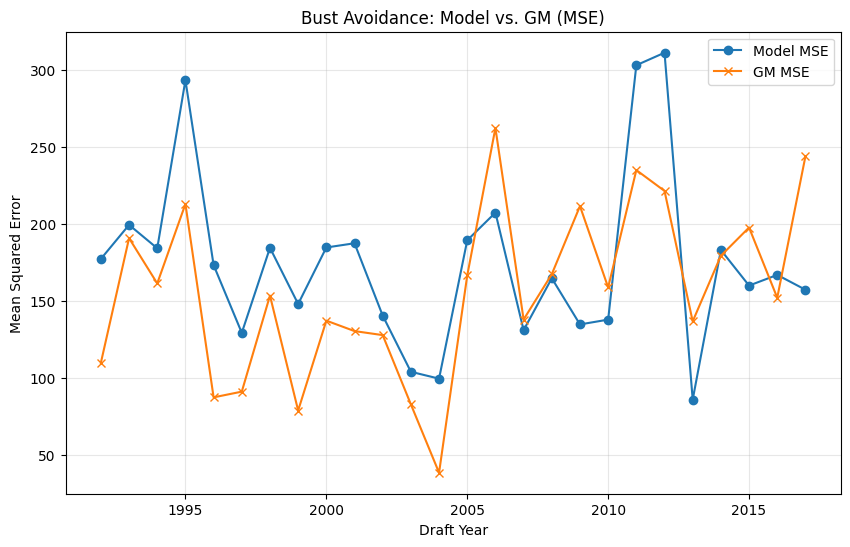

In [ ]:


plt.figure(figsize=(10, 6))
plt.plot(evaluation_results['Year'], evaluation_results['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results['Year'], evaluation_results['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE)')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

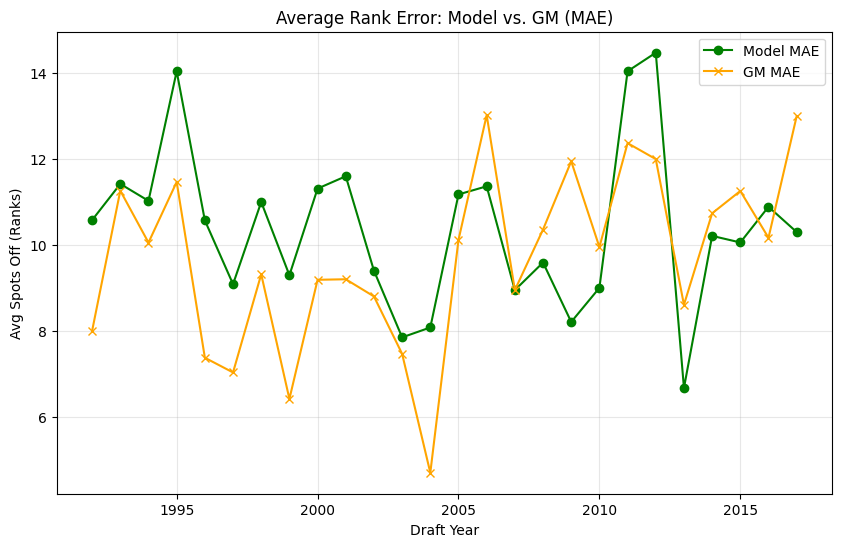

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results['Year'], evaluation_results['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results['Year'], evaluation_results['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE)')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

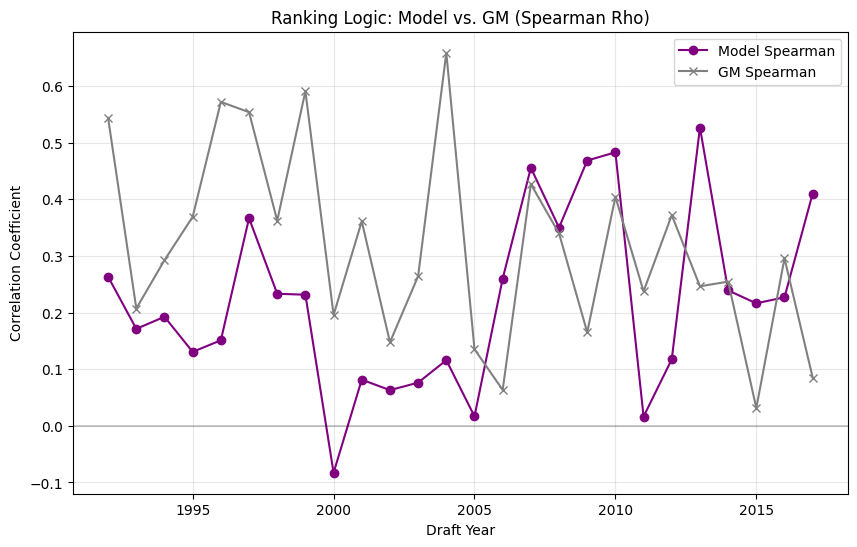

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results['Year'], evaluation_results['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results['Year'], evaluation_results['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho)')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Naive XGBoost

XGBOOST

In [ ]:

def make_xgb():
  return Pipeline([
      ("imputer", SimpleImputer(strategy="median")),
      ("xgb", XGBRegressor(n_estimators=500, learning_rate=0.05, random_state=0, n_jobs=-1))
  ])

In [ ]:
def make_xgb_evo(df=None):
    # Infer column types if df is provided
    if df is not None:
        numeric_features = df.select_dtypes(include=["int64", "float64"]).columns
        categorical_features = df.select_dtypes(include=["object"]).columns
    else:
        numeric_features = []
        categorical_features = []

    numeric_transformer = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="median"))
    ])

    categorical_transformer = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("encoder", OneHotEncoder(handle_unknown="ignore"))
    ])

    preprocessor = ColumnTransformer(
        transformers=[
            ("num", numeric_transformer, numeric_features),
            ("cat", categorical_transformer, categorical_features)
        ]
    )

    return Pipeline([
        ("preprocess", preprocessor),
        ("xgb", XGBRegressor(
            n_estimators=500,
            learning_rate=0.05,
            random_state=0,
            n_jobs=-1
        ))
    ])

In [ ]:
ranked_forward_xgb = forward_rank_by_year(dataset_final, model=make_xgb_evo(dataset_final[NCAA_FEATURES]), features=NCAA_FEATURES, target="WS/48")

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/di

In [ ]:
ranked_forward_xgb['Pk_rank'] = ranked_forward_xgb.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward_xgb['Pk_rank'] = ranked_forward_xgb['Pk_rank'].astype(int)

In [ ]:
evaluation_results_xgb = evaluate_draft_years(ranked_forward_xgb)

In [ ]:
evaluation_results_xgb

,Year,MSE_Model,MSE_GM,MAE_Model,MAE_GM,Spearman_Model,Spearman_GM
0,1992,250.000000,109.368421,13.157895,8.000000,-0.039501,0.545246
1,1993,165.736842,189.894737,9.842105,11.210526,0.310866,0.210417
2,1994,172.000000,161.297297,10.432432,10.054054,0.245614,0.292556
3,1995,257.688889,212.844444,12.311111,11.466667,0.236100,0.369038
4,1996,157.542857,86.400000,10.000000,7.371429,0.227731,0.576471
5,1997,109.428571,89.885714,8.800000,6.971429,0.463585,0.559384
6,1998,190.631579,153.105263,11.473684,9.315789,0.207353,0.363388
7,1999,155.117647,78.764706,10.235294,6.411765,0.194194,0.590833
8,2000,186.750000,137.125000,11.312500,9.187500,-0.095308,0.195748
9,2001,184.057143,130.342857,11.428571,9.200000,0.097759,0.361064


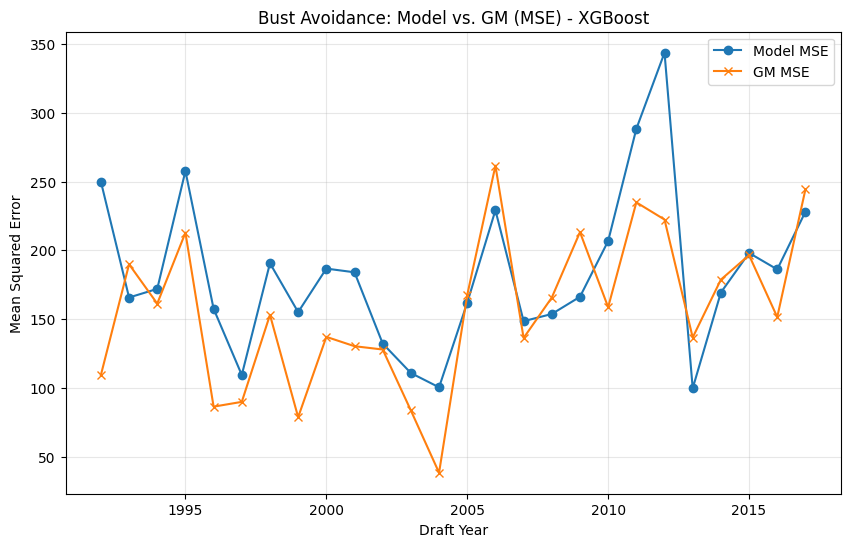

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_xgb['Year'], evaluation_results_xgb['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results_xgb['Year'], evaluation_results_xgb['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE) - XGBoost')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

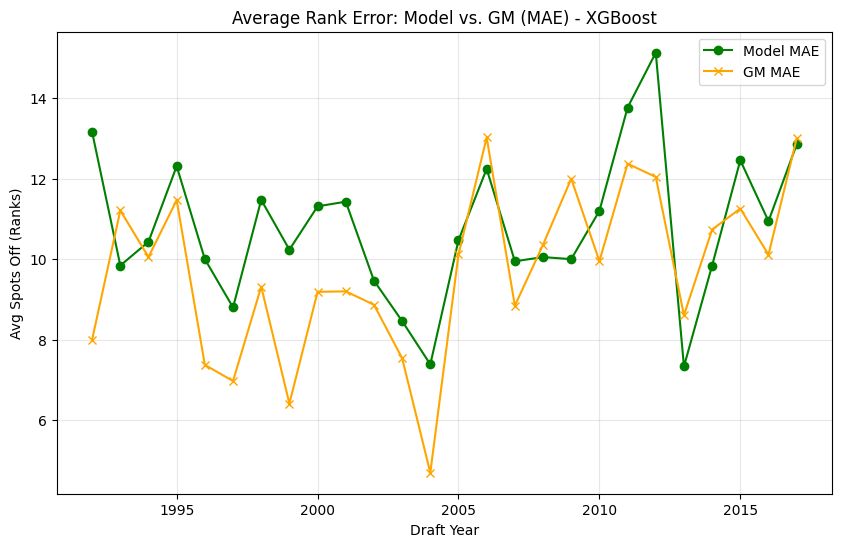

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_xgb['Year'], evaluation_results_xgb['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results_xgb['Year'], evaluation_results_xgb['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE) - XGBoost')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

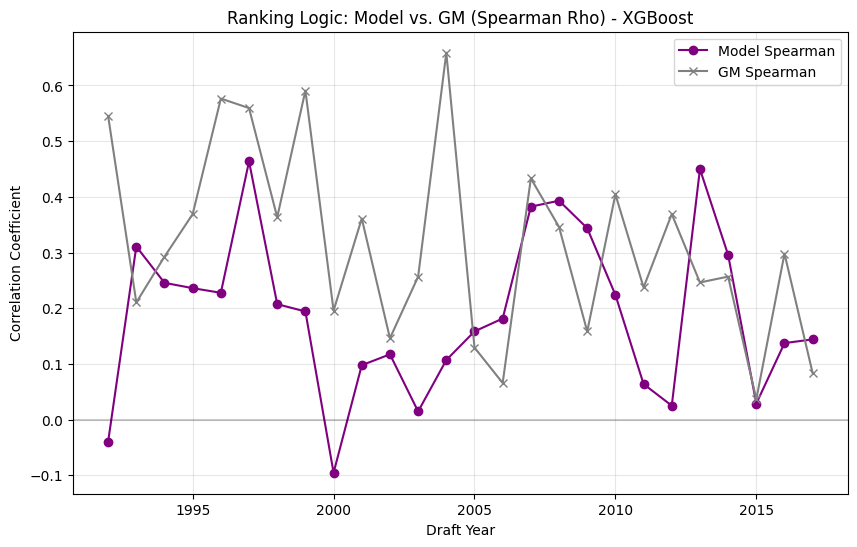

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_xgb['Year'], evaluation_results_xgb['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results_xgb['Year'], evaluation_results_xgb['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho) - XGBoost')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# LightGBM -- Naive

LightGBM

In [ ]:


def make_lgbm():
  return Pipeline([
      ("imputer", SimpleImputer(strategy="median")),
      ("lgbm", LGBMRegressor(n_estimators=500, learning_rate=0.05, random_state=0, n_jobs=-1))
  ])

In [ ]:
def make_lgbm_evo(df=None):
    # Infer column types if df is provided
    if df is not None:
        numeric_features = df.select_dtypes(include=["int64", "float64"]).columns
        categorical_features = df.select_dtypes(include=["object"]).columns
    else:
        numeric_features = []
        categorical_features = []

    numeric_transformer = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="median"))
    ])

    categorical_transformer = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("encoder", OneHotEncoder(handle_unknown="ignore"))
    ])

    preprocessor = ColumnTransformer(
        transformers=[
            ("num", numeric_transformer, numeric_features),
            ("cat", categorical_transformer, categorical_features)
        ]
    )

    return Pipeline([
        ("preprocess", preprocessor),
        ("lgbm", LGBMRegressor(
            n_estimators=500,
            learning_rate=0.05,
            random_state=0,
            n_jobs=-1
        ))
    ])

In [ ]:
ranked_forward_lgbm = forward_rank_by_year(dataset_final, model=make_lgbm_evo(dataset_final[NCAA_FEATURES]), features=NCAA_FEATURES, target="WS/48")

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 34, number of used features: 0
[LightGBM] [Info] Start training from score 0.065882
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016934 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 229
[LightGBM] [Info] Number of data points in the train set: 72, number of used features: 11
[LightGBM] [Info] Start training from score 0.069583
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarn

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 556
[LightGBM] [Info] Number of data points in the train set: 227, number of used features: 11
[LightGBM] [Info] Start training from score 0.066630
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarn

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000042 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 675
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 11
[LightGBM] [Info] Start training from score 0.068510
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarn

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 893
[LightGBM] [Info] Number of data points in the train set: 483, number of used features: 11
[LightGBM] [Info] Start training from score 0.063718
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 955
[LightGBM] [Info] Number of data points in the train set: 517, number of used features: 11
[LightGBM] [Info] Start training from score 0.065222
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000163 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 996
[LightGBM] [Info] Number of data points in the train set: 558, number of used features: 11
[LightGBM] [Info] Start training from score 0.065505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1025
[LightGBM] [Info] Number of data points in the train set: 596, number of used features: 11
[LightGBM] [Info] Start training from score 0.065284
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1063
[LightGBM] [Info] Number of data points in the train set: 635, number of used features: 11
[LightGBM] [Info] Start training from score 0.066036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1158
[LightGBM] [Info] Number of data points in the train set: 757, number of used features: 11
[LightGBM] [Info] Start training from score 0.066552
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1188
[LightGBM] [Info] Number of data points in the train set: 803, number of used features: 11
[LightGBM] [Info] Start training from score 0.065471
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1199
[LightGBM] [Info] Number of data points in the train set: 836, number of used features: 11
[LightGBM] [Info] Start training from score 0.065640
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000163 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1221
[LightGBM] [Info] Number of data points in the train set: 874, number of used features: 11
[LightGBM] [Info] Start training from score 0.065295


/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000159 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1235
[LightGBM] [Info] Number of data points in the train set: 909, number of used features: 11
[LightGBM] [Info] Start training from score 0.066013


/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1249
[LightGBM] [Info] Number of data points in the train set: 945, number of used features: 11
[LightGBM] [Info] Start training from score 0.064904


/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


In [ ]:
ranked_forward_lgbm['Pk_rank'] = ranked_forward_lgbm.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward_lgbm['Pk_rank'] = ranked_forward_lgbm['Pk_rank'].astype(int)

In [ ]:
evaluation_results_lgbm = evaluate_draft_years(ranked_forward_lgbm)

In [ ]:
evaluation_results_lgbm

,Year,MSE_Model,MSE_GM,MAE_Model,MAE_GM,Spearman_Model,Spearman_GM
0,1992,175.947368,112.000000,10.736842,8.105263,0.268410,0.534304
1,1993,201.894737,191.684211,11.105263,11.315789,0.160521,0.202976
2,1994,254.108108,161.243243,12.918919,10.054054,-0.114509,0.292793
3,1995,270.088889,212.222222,14.000000,11.422222,0.199341,0.370883
4,1996,179.428571,86.628571,10.800000,7.371429,0.120448,0.575350
5,1997,125.257143,89.428571,9.314286,6.914286,0.385994,0.561625
6,1998,163.421053,154.052632,10.684211,9.263158,0.320495,0.359449
7,1999,149.058824,78.764706,9.529412,6.411765,0.225668,0.590833
8,2000,206.000000,137.125000,12.125000,9.187500,-0.208211,0.195748
9,2001,203.314286,131.314286,12.000000,9.257143,0.003361,0.356303


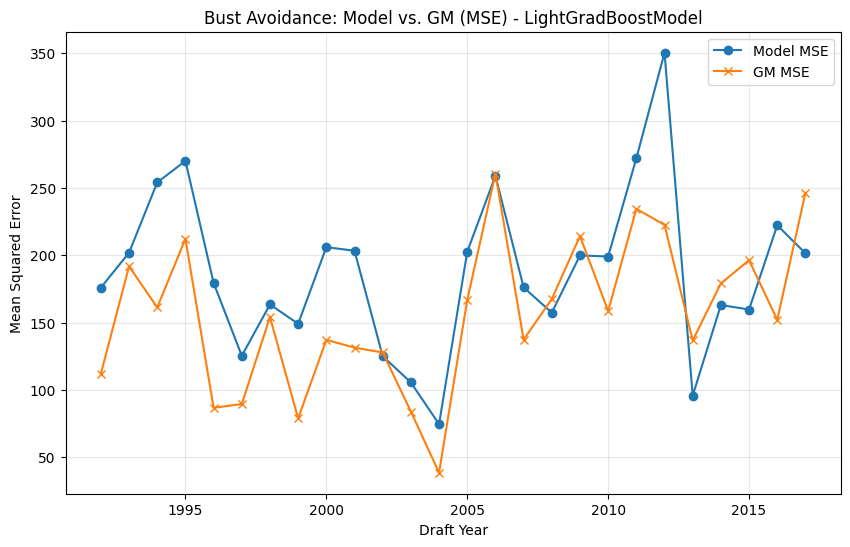

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_lgbm['Year'], evaluation_results_lgbm['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results_lgbm['Year'], evaluation_results_lgbm['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE) - LightGradBoostModel')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

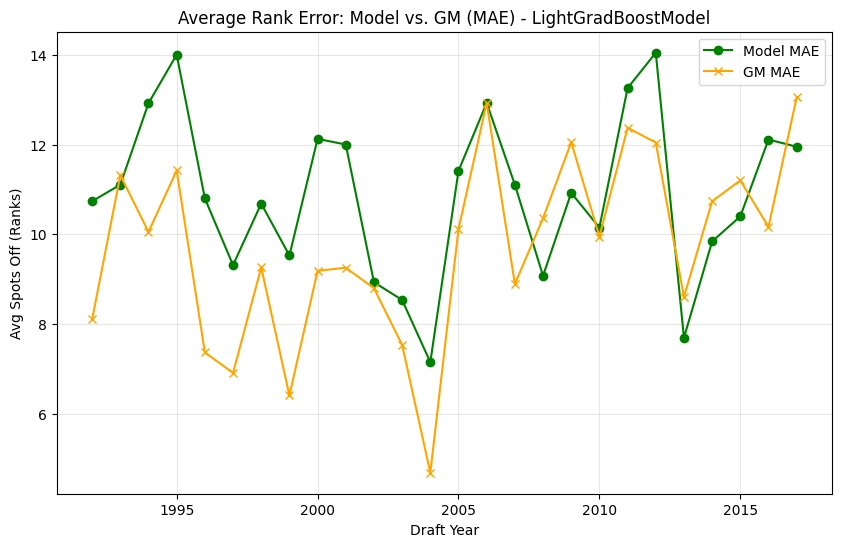

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_lgbm['Year'], evaluation_results_lgbm['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results_lgbm['Year'], evaluation_results_lgbm['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE) - LightGradBoostModel')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

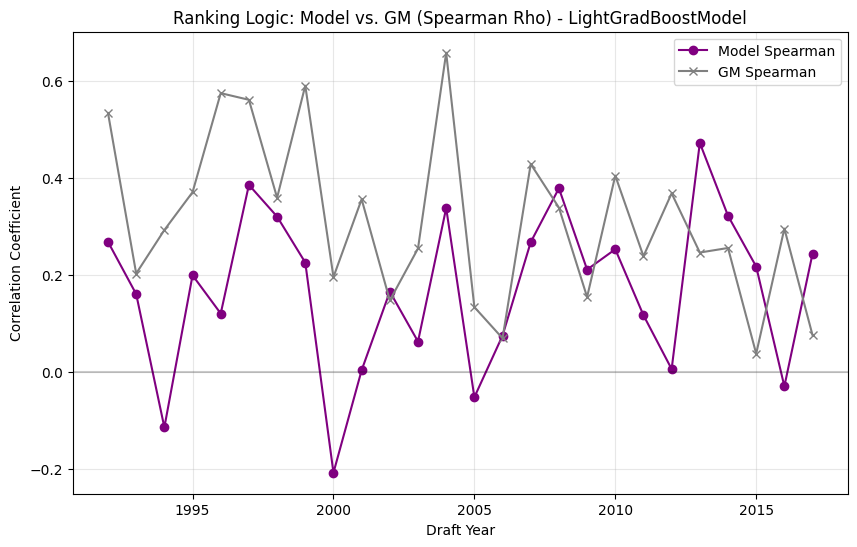

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_lgbm['Year'], evaluation_results_lgbm['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results_lgbm['Year'], evaluation_results_lgbm['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho) - LightGradBoostModel')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# ExtraTrees -- Naive

ExtraTrees

In [ ]:


def make_ext():
  return Pipeline([
      ("imputer", SimpleImputer(strategy="median")),
      ("ext", ExtraTreesRegressor(n_estimators=500, random_state=0, n_jobs=-1))
  ])

In [ ]:
def make_ext_evo(df=None):
    # Infer column types if df is provided
    if df is not None:
        numeric_features = df.select_dtypes(include=["int64", "float64"]).columns
        categorical_features = df.select_dtypes(include=["object"]).columns
    else:
        numeric_features = []
        categorical_features = []

    numeric_transformer = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="median"))
    ])

    categorical_transformer = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("encoder", OneHotEncoder(handle_unknown="ignore"))
    ])

    preprocessor = ColumnTransformer(
        transformers=[
            ("num", numeric_transformer, numeric_features),
            ("cat", categorical_transformer, categorical_features)
        ]
    )

    return Pipeline([
        ("preprocess", preprocessor),
        ("ext", ExtraTreesRegressor(
            n_estimators=500,
            random_state=0,
            n_jobs=-1
        ))
    ])

In [ ]:
ranked_forward_ext = forward_rank_by_year(dataset_final, model=make_ext_evo(dataset_final[NCAA_FEATURES]), features=NCAA_FEATURES, target="WS/48")

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/di

In [ ]:
ranked_forward_ext['Pk_rank'] = ranked_forward_ext.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward_ext['Pk_rank'] = ranked_forward_ext['Pk_rank'].astype(int)

In [ ]:
evaluation_results_ext = evaluate_draft_years(ranked_forward_ext)

In [ ]:
evaluation_results_ext

,Year,MSE_Model,MSE_GM,MAE_Model,MAE_GM,Spearman_Model,Spearman_GM
0,1992,185.736842,112.421053,10.736842,8.157895,0.227705,0.532553
1,1993,213.894737,191.894737,12.578947,11.315789,0.110625,0.202101
2,1994,192.432432,162.162162,11.621622,10.108108,0.155998,0.288762
3,1995,306.844444,212.266667,15.022222,11.422222,0.090382,0.370751
4,1996,164.800000,86.857143,10.000000,7.314286,0.192157,0.574230
5,1997,114.514286,91.200000,8.342857,6.971429,0.438655,0.552941
6,1998,198.736842,154.368421,11.315789,9.315789,0.173651,0.358135
7,1999,117.352941,79.588235,8.588235,6.470588,0.390374,0.586555
8,2000,203.812500,137.125000,12.187500,9.187500,-0.195381,0.195748
9,2001,179.314286,131.942857,11.314286,9.257143,0.121008,0.353221


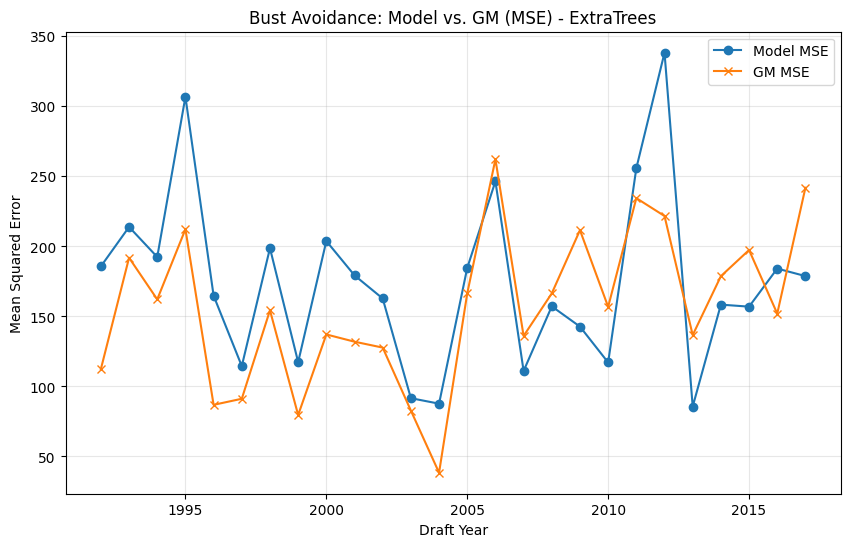

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_ext['Year'], evaluation_results_ext['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results_ext['Year'], evaluation_results_ext['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE) - ExtraTrees')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

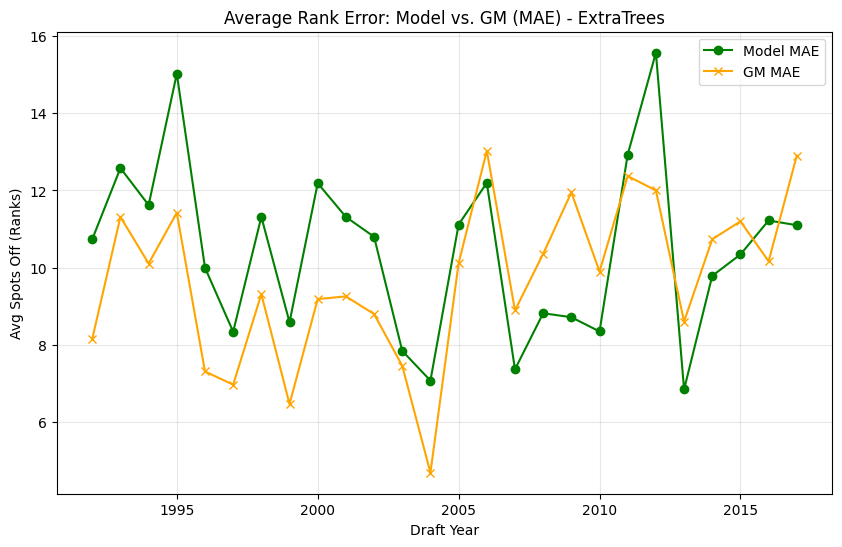

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_ext['Year'], evaluation_results_ext['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results_ext['Year'], evaluation_results_ext['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE) - ExtraTrees')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

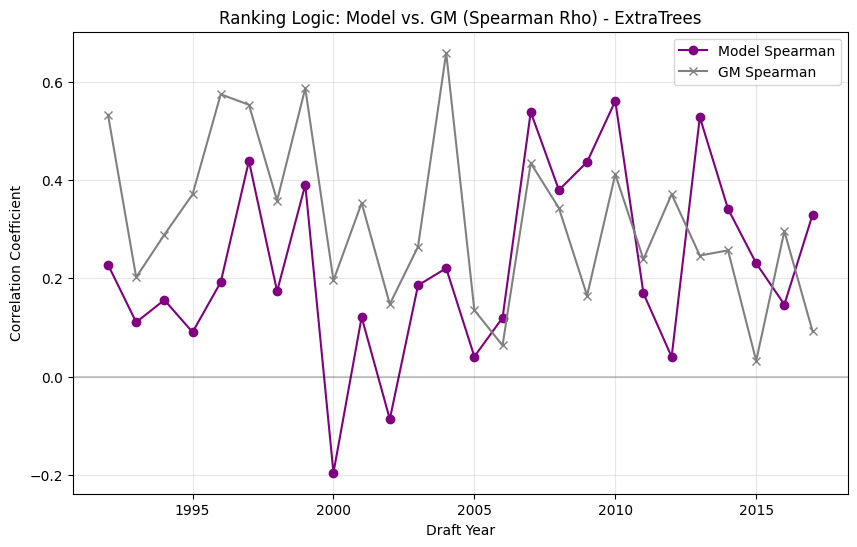

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_ext['Year'], evaluation_results_ext['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results_ext['Year'], evaluation_results_ext['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho) - ExtraTrees')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# KNN -- Naive

KNN

In [ ]:


def make_knn():
  return Pipeline([
      ("imputer", SimpleImputer(strategy="median")),
      ("knn", KNeighborsRegressor(n_neighbors=5))
  ])

In [ ]:
def make_knn_evo(df=None):
    # Infer column types if df is provided
    if df is not None:
        numeric_features = df.select_dtypes(include=["int64", "float64"]).columns
        categorical_features = df.select_dtypes(include=["object"]).columns
    else:
        numeric_features = []
        categorical_features = []

    numeric_transformer = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="median"))
    ])

    categorical_transformer = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("encoder", OneHotEncoder(handle_unknown="ignore"))
    ])

    preprocessor = ColumnTransformer(
        transformers=[
            ("num", numeric_transformer, numeric_features),
            ("cat", categorical_transformer, categorical_features)
        ]
    )

    return Pipeline([
        ("preprocess", preprocessor),
        ("knn", KNeighborsRegressor(
            n_neighbors=5
        ))
    ])

In [ ]:
ranked_forward_knn = forward_rank_by_year(dataset_final, model=make_knn_evo(dataset_final[NCAA_FEATURES]), features=NCAA_FEATURES, target="WS/48")

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/di

In [ ]:
ranked_forward_knn['Pk_rank'] = ranked_forward_knn.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward_knn['Pk_rank'] = ranked_forward_lgbm['Pk_rank'].astype(int)

In [ ]:
evaluation_results_knn = evaluate_draft_years(ranked_forward_knn)

In [ ]:
evaluation_results_knn

,Year,MSE_Model,MSE_GM,MAE_Model,MAE_GM,Spearman_Model,Spearman_GM
0,1992,199.631579,130.947368,11.789474,9.105263,0.169931,0.455520
1,1993,196.105263,201.157895,10.894737,11.263158,0.184594,0.163585
2,1994,199.405405,169.621622,11.405405,10.108108,0.125415,0.256046
3,1995,331.111111,300.800000,14.577778,14.488889,0.018445,0.108300
4,1996,264.628571,142.000000,13.657143,9.428571,-0.297199,0.303922
5,1997,229.771429,221.142857,12.742857,11.942857,-0.126331,-0.084034
6,1998,241.105263,218.473684,13.157895,12.789474,-0.002517,0.091586
7,1999,181.647059,158.941176,10.294118,10.529412,0.056379,0.174332
8,2000,206.562500,129.687500,12.375000,9.000000,-0.211510,0.239370
9,2001,235.028571,285.085714,12.914286,14.800000,-0.152101,-0.397479


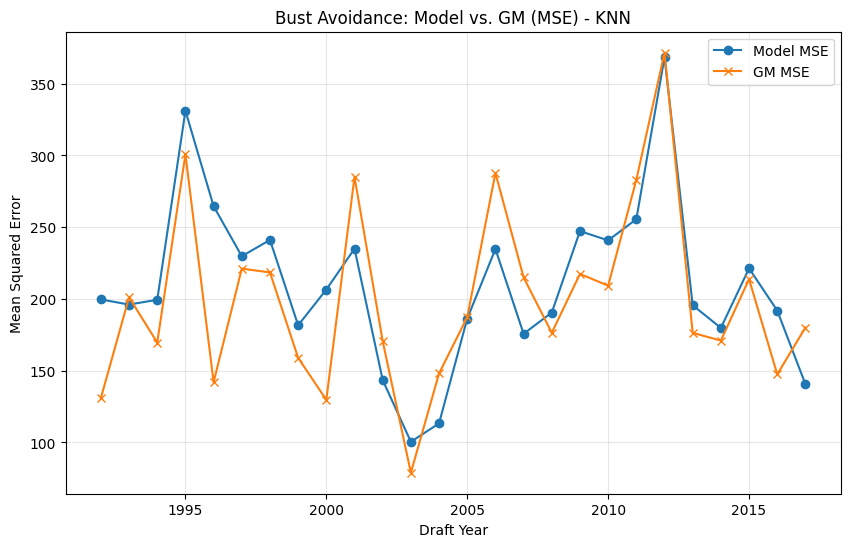

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_knn['Year'], evaluation_results_knn['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results_knn['Year'], evaluation_results_knn['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE) - KNN')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

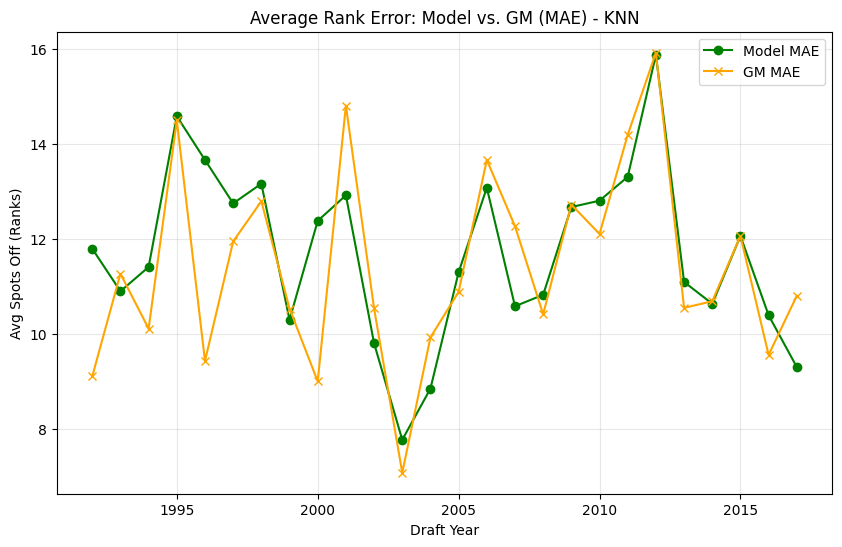

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_knn['Year'], evaluation_results_knn['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results_knn['Year'], evaluation_results_knn['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE) - KNN')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

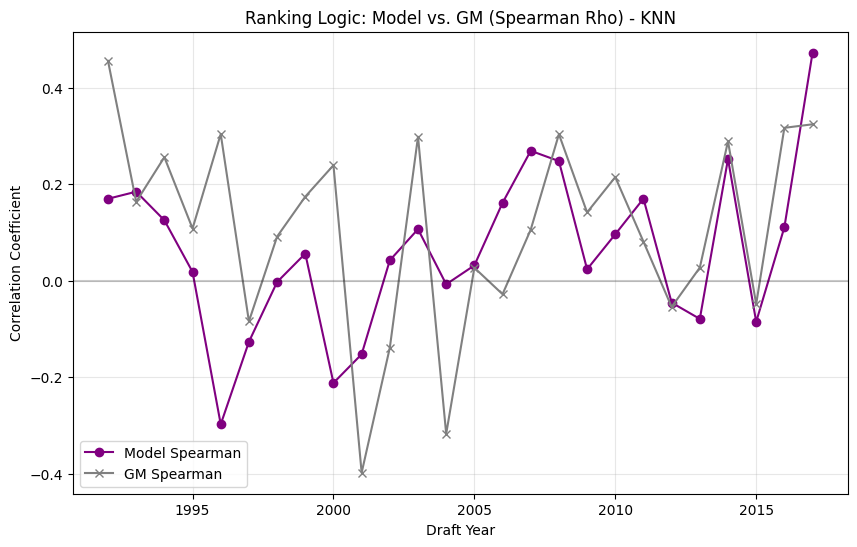

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_knn['Year'], evaluation_results_knn['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results_knn['Year'], evaluation_results_knn['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho) - KNN')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# MLP -- Naive

MLP

In [ ]:


def make_mlp():
  return Pipeline([
      ("imputer", SimpleImputer(strategy="median")),
      ("mlp", MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=500, random_state=0))
  ])

In [ ]:
def make_mlp_evo(df=None):
    # Infer column types if df is provided
    if df is not None:
        numeric_features = df.select_dtypes(include=["int64", "float64"]).columns
        categorical_features = df.select_dtypes(include=["object"]).columns
    else:
        numeric_features = []
        categorical_features = []

    numeric_transformer = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="median"))
    ])

    categorical_transformer = Pipeline(steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("encoder", OneHotEncoder(handle_unknown="ignore"))
    ])

    preprocessor = ColumnTransformer(
        transformers=[
            ("num", numeric_transformer, numeric_features),
            ("cat", categorical_transformer, categorical_features)
        ]
    )

    return Pipeline([
        ("preprocess", preprocessor),
        ("mlp", MLPRegressor(
            hidden_layer_sizes=(100, 50),
            max_iter=500,
            random_state=0
        ))
    ])

In [ ]:
ranked_forward_mlp = forward_rank_by_year(dataset_final, model=make_mlp_evo(dataset_final[NCAA_FEATURES]), features=NCAA_FEATURES, target="WS/48")

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/di

In [ ]:
ranked_forward_mlp['Pk_rank'] = ranked_forward_mlp.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward_mlp['Pk_rank'] = ranked_forward_mlp['Pk_rank'].astype(int)

In [ ]:
evaluation_results_mlp = evaluate_draft_years(ranked_forward_mlp)

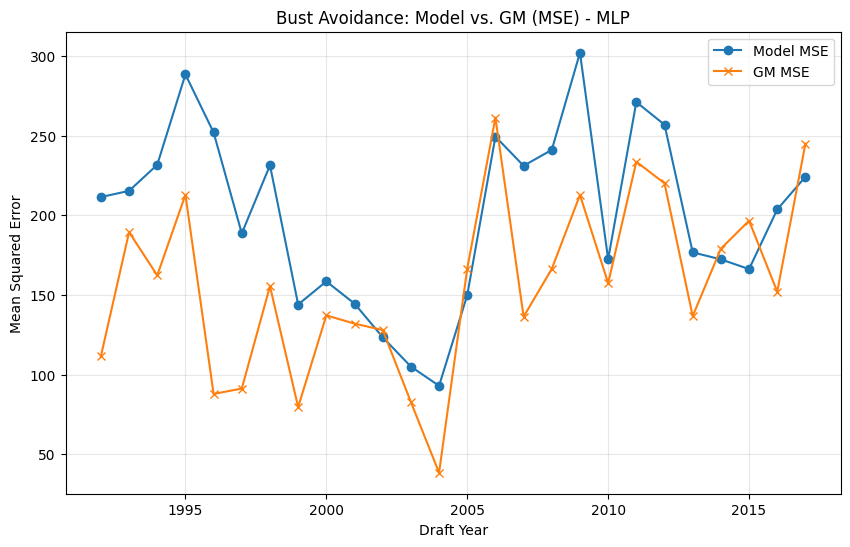

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_mlp['Year'], evaluation_results_mlp['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results_mlp['Year'], evaluation_results_mlp['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE) - MLP')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

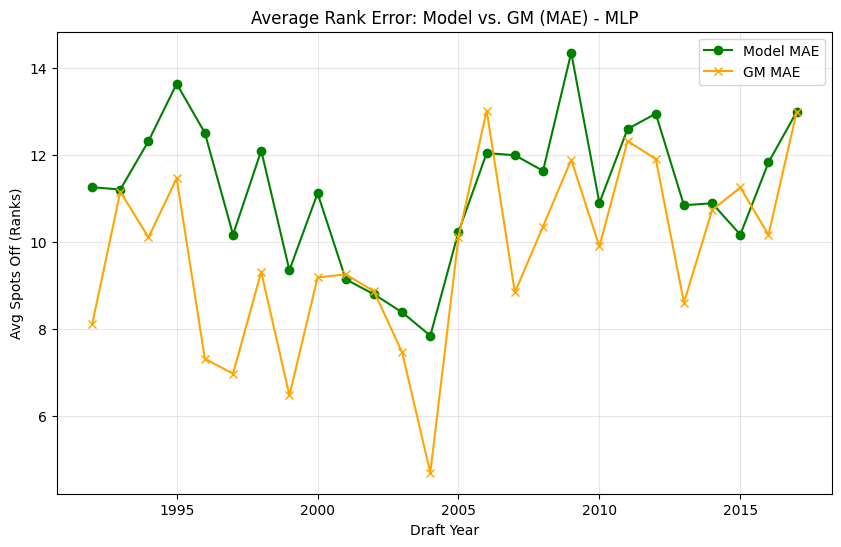

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_mlp['Year'], evaluation_results_mlp['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results_mlp['Year'], evaluation_results_mlp['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE) - MLP')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

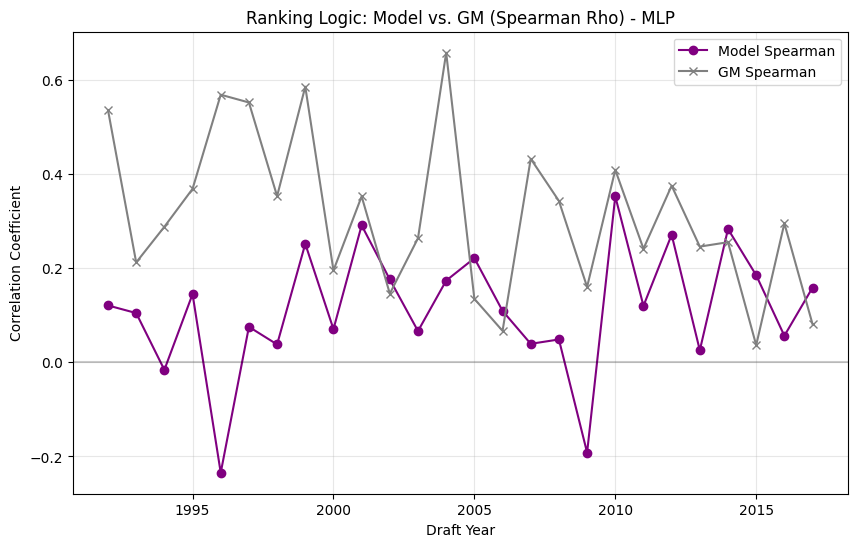

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_mlp['Year'], evaluation_results_mlp['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results_mlp['Year'], evaluation_results_mlp['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho) - MLP')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

Outlier Case 1: 1996

In [ ]:
for idx, row in dataset_final[dataset_final['DraftYear']==1996].sort_values('Pk').iterrows():
  print(row['name'], row['college'], row['Pk'])

Allen Iverson Georgetown University 1
Marcus Camby University of Massachusetts Amherst 2
Shareef Abdur-Rahim University of California 3
Stephon Marbury Georgia Institute of Technology 4
Ray Allen University of Connecticut 5
Antoine Walker University of Kentucky 6
Lorenzen Wright University of Memphis 7
Kerry Kittles Villanova University 8
Samaki Walker University of Louisville 9
Erick Dampier Mississippi State University 10
Todd Fuller North Carolina State University 11
Vitaly Potapenko Wright State University 12
Steve Nash Santa Clara University 15
Tony Delk University of Kentucky 16
John Wallace Syracuse University 18
Walter McCarty University of Kentucky 19
Roy Rogers University of Alabama 22
Derek Fisher University of Arkansas at Little Rock 24
Jerome Williams Georgetown University 26
Brian Evans Indiana University 27
Travis Knight University of Connecticut 29
Othella Harrington Georgetown University 30
Mark Hendrickson Washington State University 31
Jeff McInnis University of Nort

# Second Iteration of Training Models -- Preprocessed Data, Smaller Feature Set

Preprocessed Basic Dataset -> Pre-built Model Performance Comparison

# Random Forests using Preprocessed Data

Random Forests:

In [ ]:
NCAA_FEATURES_P = ['NCAA__3ptpct',
       'NCAA_efgpct', 'NCAA_fgpct', 'NCAA_ft', 'NCAA_games', 'NCAA_ppg','NCAA_pts_per_40']

In [ ]:
ranked_forward_rf_p = forward_rank_by_year(dataset_final_preprocessed, model=make_rf_evo(dataset_final_preprocessed[NCAA_FEATURES_P]), features=NCAA_FEATURES_P, target="VORP")

# Switching to VORP per lit review

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/di

In [ ]:
ranked_forward_rf_p['Pk_rank'] = ranked_forward_rf_p.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward_rf_p['Pk_rank'] = ranked_forward_rf_p['Pk_rank'].astype(int)

In [ ]:
#evalyated
evaluation_results_rf_p = evaluate_draft_years(ranked_forward_rf_p)

In [ ]:
evaluation_results_rf_p

,Year,MSE_Model,MSE_GM,MAE_Model,MAE_GM,Spearman_Model,Spearman_GM
0,1992,245.947368,88.684211,12.526316,7.631579,-0.022650,0.631251
1,1993,171.105263,182.736842,10.526316,10.000000,0.288544,0.240179
2,1994,240.864865,151.027027,13.405405,10.000000,-0.056425,0.337601
3,1995,295.955556,252.311111,14.266667,12.666667,0.122661,0.252042
4,1996,127.600000,124.571429,8.571429,8.742857,0.374510,0.389356
5,1997,140.514286,112.457143,9.371429,8.000000,0.311204,0.448739
6,1998,163.368421,138.421053,9.736842,8.736842,0.320713,0.424445
7,1999,139.882353,60.941176,9.352941,6.470588,0.273338,0.683422
8,2000,100.250000,165.750000,8.375000,10.750000,0.412023,0.027859
9,2001,192.857143,118.914286,11.885714,8.800000,0.054622,0.417087


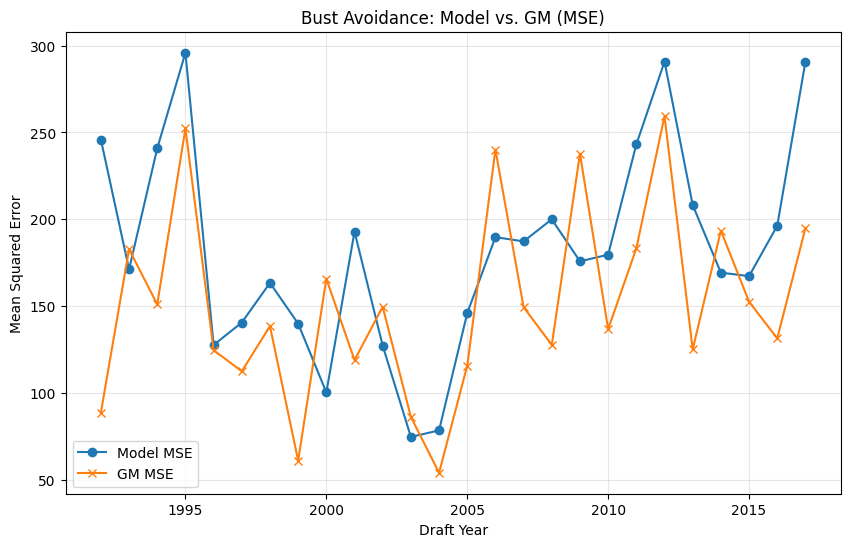

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_rf_p['Year'], evaluation_results_rf_p['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results_rf_p['Year'], evaluation_results_rf_p['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE)')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

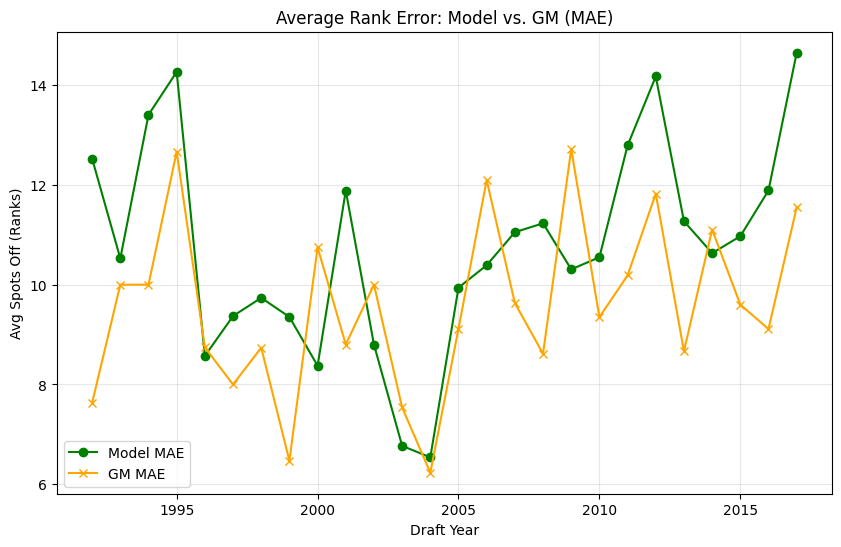

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_rf_p['Year'], evaluation_results_rf_p['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results_rf_p['Year'], evaluation_results_rf_p['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE)')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

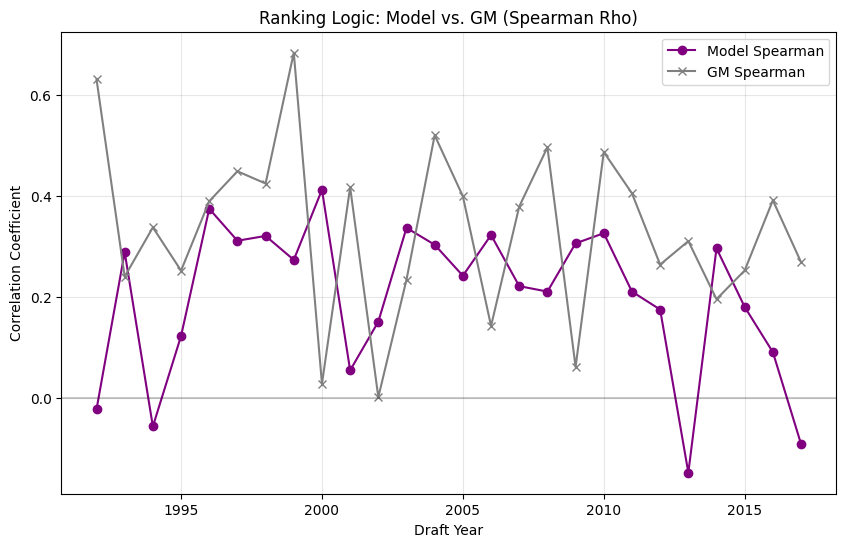

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_rf_p['Year'], evaluation_results_rf_p['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results_rf_p['Year'], evaluation_results_rf_p['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho)')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# XGBoost using Preprocessed Data

XGBoost - Preprocessed Data

In [ ]:
ranked_forward_xgb_p = forward_rank_by_year(dataset_final_preprocessed, model=make_xgb_evo(dataset_final_preprocessed[NCAA_FEATURES_P]), features=NCAA_FEATURES_P, target="VORP")

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/di

In [ ]:
ranked_forward_xgb_p['Pk_rank'] = ranked_forward_xgb_p.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward_xgb_p['Pk_rank'] = ranked_forward_xgb_p['Pk_rank'].astype(int)

In [ ]:
evaluation_results_xgb_p = evaluate_draft_years(ranked_forward_xgb_p)

In [ ]:
evaluation_results_xgb_p

,Year,MSE_Model,MSE_GM,MAE_Model,MAE_GM,Spearman_Model,Spearman_GM
0,1992,265.473684,86.157895,13.263158,7.526316,-0.103841,0.641755
1,1993,210.736842,182.157895,12.000000,9.894737,0.123755,0.242587
2,1994,254.270270,150.864865,13.513514,10.000000,-0.115220,0.338312
3,1995,269.555556,248.800000,13.333333,12.488889,0.200922,0.262451
4,1996,124.914286,124.000000,7.942857,8.742857,0.387675,0.392157
5,1997,127.371429,113.542857,8.857143,8.057143,0.375630,0.443417
6,1998,175.684211,137.210526,10.157895,8.736842,0.269504,0.429478
7,1999,150.411765,61.529412,9.588235,6.470588,0.218640,0.680367
8,2000,136.000000,166.125000,9.875000,10.750000,0.202346,0.025660
9,2001,185.028571,120.114286,11.257143,8.800000,0.092997,0.411204


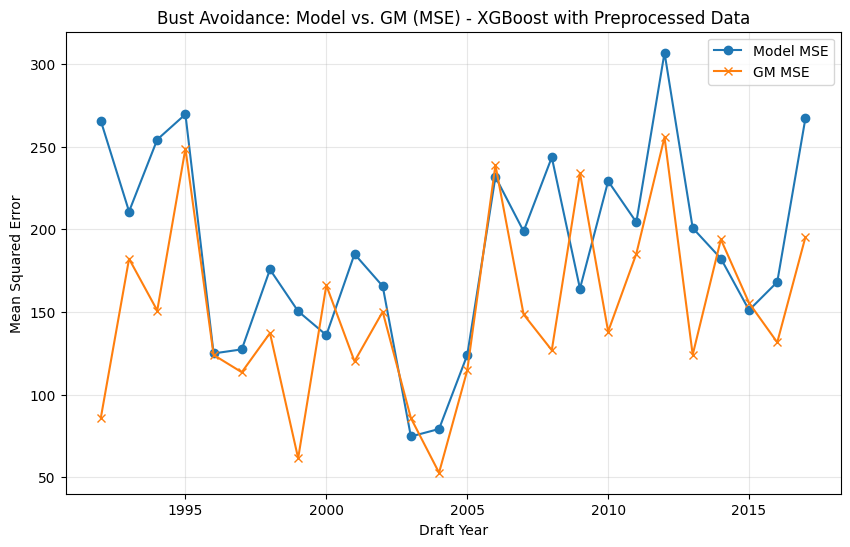

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_xgb_p['Year'], evaluation_results_xgb_p['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results_xgb_p['Year'], evaluation_results_xgb_p['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE) - XGBoost with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

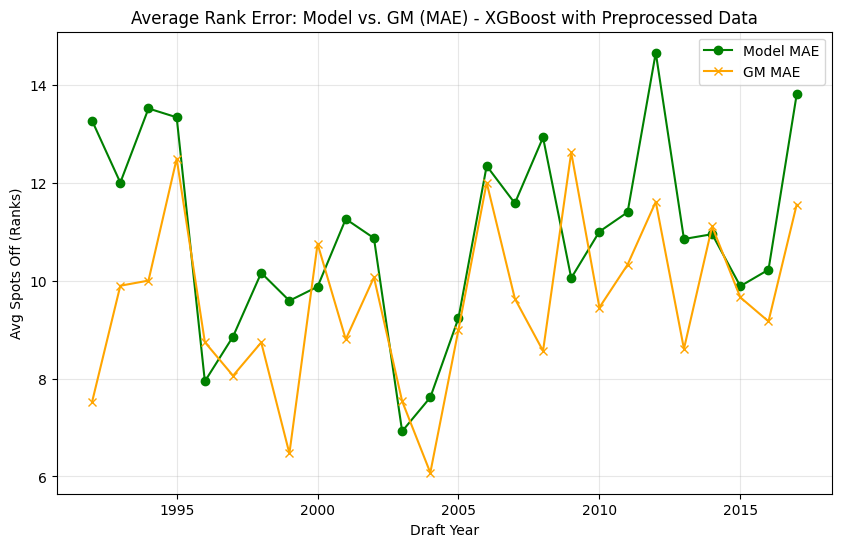

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_xgb_p['Year'], evaluation_results_xgb_p['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results_xgb_p['Year'], evaluation_results_xgb_p['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE) - XGBoost with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

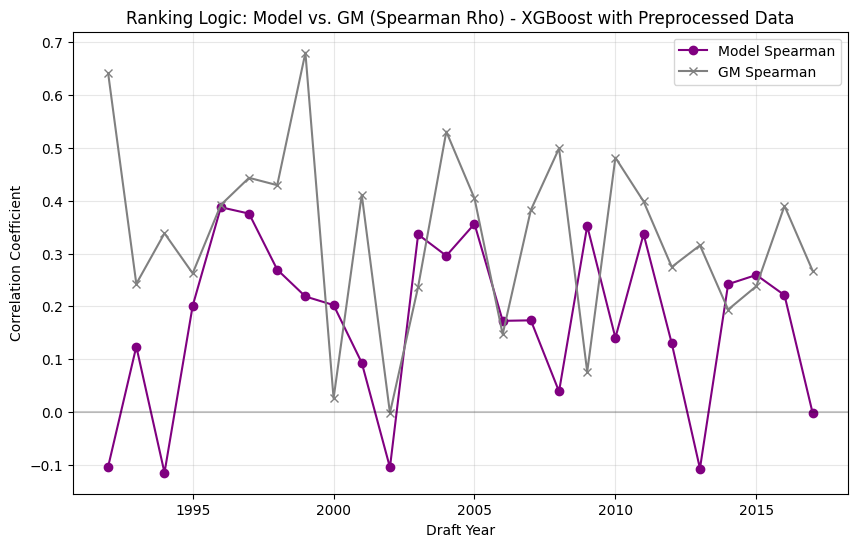

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_xgb_p['Year'], evaluation_results_xgb_p['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results_xgb_p['Year'], evaluation_results_xgb_p['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho) - XGBoost with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# LightGBM -- Preprocessed Data

LightGBM - Preprocessed Data

In [ ]:
ranked_forward_lgbm_p = forward_rank_by_year(dataset_final_preprocessed, model=make_lgbm_evo(dataset_final_preprocessed[NCAA_FEATURES_P]), features=NCAA_FEATURES_P, target="VORP")

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: 

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 34, number of used features: 0
[LightGBM] [Info] Start training from score 5.870588
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarn

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000082 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 520
[LightGBM] [Info] Number of data points in the train set: 334, number of used features: 6
[LightGBM] [Info] Start training from score 6.463473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarn

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000064 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 632
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 6
[LightGBM] [Info] Start training from score 5.759861
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 817
[LightGBM] [Info] Number of data points in the train set: 558, number of used features: 6
[LightGBM] [Info] Start training from score 5.936201
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 852
[LightGBM] [Info] Number of data points in the train set: 596, number of used features: 6
[LightGBM] [Info] Start training from score 5.941946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 894
[LightGBM] [Info] Number of data points in the train set: 635, number of used features: 6
[LightGBM] [Info] Start training from score 5.948031
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 990
[LightGBM] [Info] Number of data points in the train set: 714, number of used features: 6
[LightGBM] [Info] Start training from score 5.984454
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000153 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1070
[LightGBM] [Info] Number of data points in the train set: 874, number of used features: 6
[LightGBM] [Info] Start training from score 5.554005


/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1080
[LightGBM] [Info] Number of data points in the train set: 909, number of used features: 6
[LightGBM] [Info] Start training from score 5.466337


/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1093
[LightGBM] [Info] Number of data points in the train set: 945, number of used features: 6
[LightGBM] [Info] Start training from score 5.326032


/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


In [ ]:
ranked_forward_lgbm_p['Pk_rank'] = ranked_forward_lgbm_p.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward_lgbm_p['Pk_rank'] = ranked_forward_lgbm_p['Pk_rank'].astype(int)

In [ ]:
evaluation_results_lgbm_p = evaluate_draft_years(ranked_forward_lgbm_p)

In [ ]:
evaluation_results_lgbm_p

,Year,MSE_Model,MSE_GM,MAE_Model,MAE_GM,Spearman_Model,Spearman_GM
0,1992,216.684211,87.421053,12.421053,7.526316,0.099026,0.636503
1,1993,146.684211,188.631579,9.263158,10.210526,0.390086,0.215669
2,1994,232.378378,151.027027,12.594595,10.000000,-0.019203,0.337601
3,1995,338.044444,251.244444,14.666667,12.622222,-0.002108,0.255204
4,1996,151.657143,124.457143,9.942857,8.742857,0.256583,0.389916
5,1997,95.314286,112.285714,7.485714,8.057143,0.532773,0.449580
6,1998,155.526316,137.263158,10.052632,8.736842,0.353321,0.429259
7,1999,137.058824,61.058824,9.235294,6.470588,0.288006,0.682811
8,2000,115.062500,166.937500,8.562500,10.750000,0.325147,0.020894
9,2001,227.828571,120.000000,12.114286,8.742857,-0.116807,0.411765


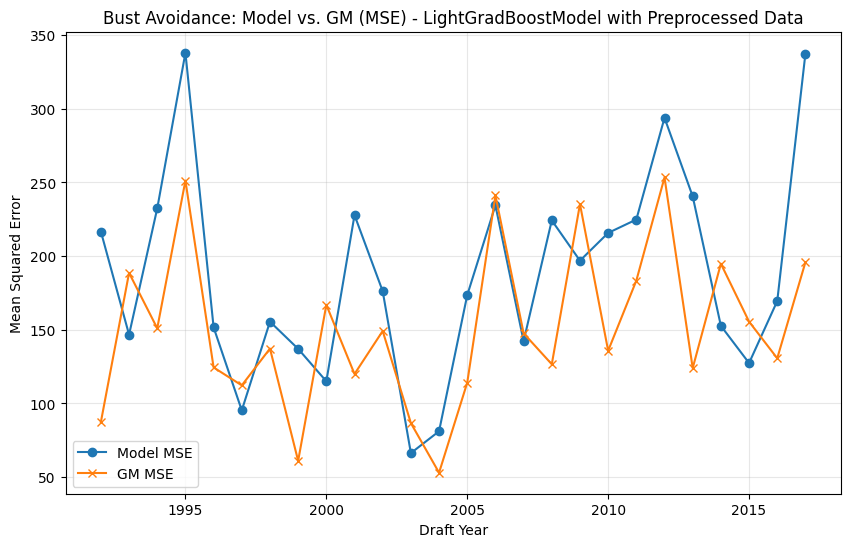

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_lgbm_p['Year'], evaluation_results_lgbm_p['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results_lgbm_p['Year'], evaluation_results_lgbm_p['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE) - LightGradBoostModel with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

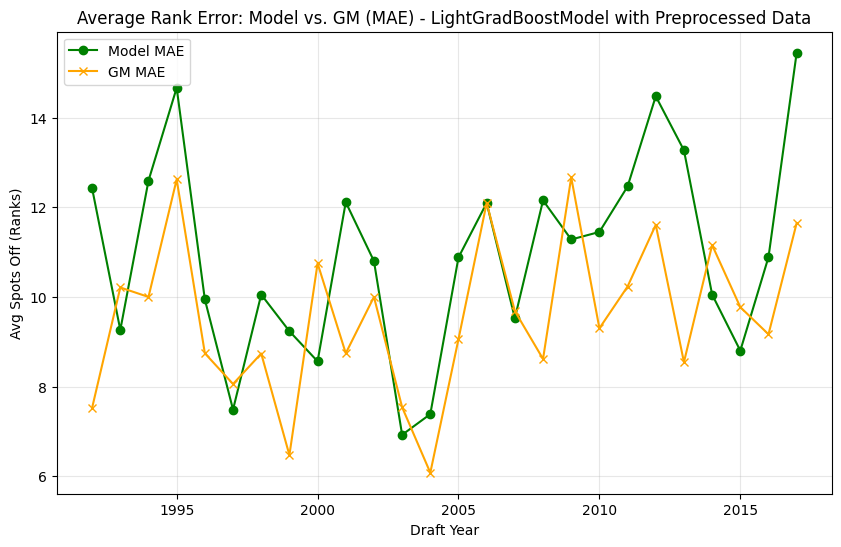

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_lgbm_p['Year'], evaluation_results_lgbm_p['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results_lgbm_p['Year'], evaluation_results_lgbm_p['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE) - LightGradBoostModel with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

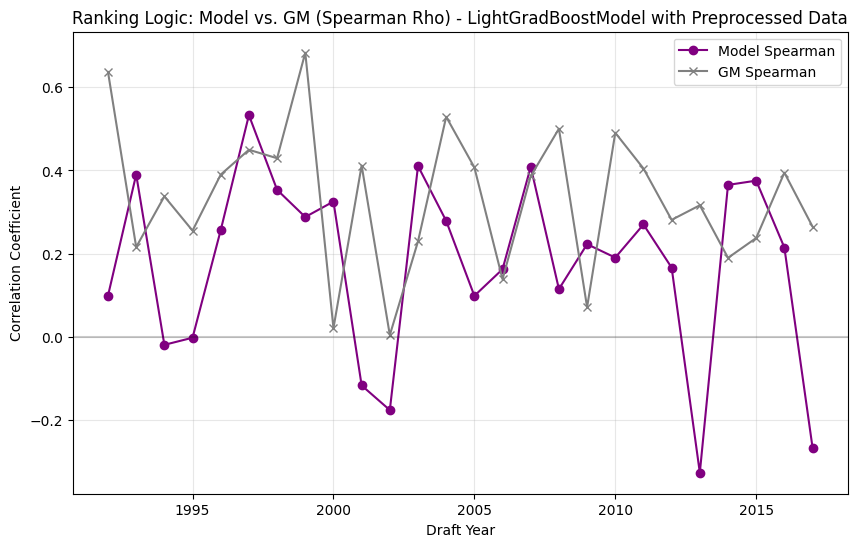

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_lgbm_p['Year'], evaluation_results_lgbm_p['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results_lgbm_p['Year'], evaluation_results_lgbm_p['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho) - LightGradBoostModel with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# ExtraTrees -- Preprocessed Data

ExtraTrees - Preprocessed Data

In [ ]:
ranked_forward_ext_p = forward_rank_by_year(dataset_final_preprocessed, model=make_ext_evo(dataset_final_preprocessed[NCAA_FEATURES_P]), features=NCAA_FEATURES_P, target="VORP")

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/di

In [ ]:
ranked_forward_ext_p['Pk_rank'] = ranked_forward_ext_p.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward_ext_p['Pk_rank'] = ranked_forward_ext_p['Pk_rank'].astype(int)

In [ ]:
evaluation_results_ext_p = evaluate_draft_years(ranked_forward_ext_p)

In [ ]:
evaluation_results_ext_p

,Year,MSE_Model,MSE_GM,MAE_Model,MAE_GM,Spearman_Model,Spearman_GM
0,1992,214.105263,85.789474,12.105263,7.526316,0.109749,0.643287
1,1993,171.789474,183.684211,10.421053,10.000000,0.285699,0.236240
2,1994,192.378378,151.027027,11.405405,10.000000,0.156235,0.337601
3,1995,333.688889,247.377778,15.066667,12.488889,0.010804,0.266667
4,1996,133.028571,123.542857,8.800000,8.571429,0.347899,0.394398
5,1997,123.257143,112.971429,8.971429,8.000000,0.395798,0.446218
6,1998,166.421053,138.368421,9.947368,8.736842,0.308021,0.424664
7,1999,122.058824,60.941176,8.588235,6.470588,0.365928,0.683422
8,2000,111.062500,165.812500,8.687500,10.750000,0.348607,0.027493
9,2001,206.057143,118.000000,11.828571,8.685714,-0.010084,0.421569


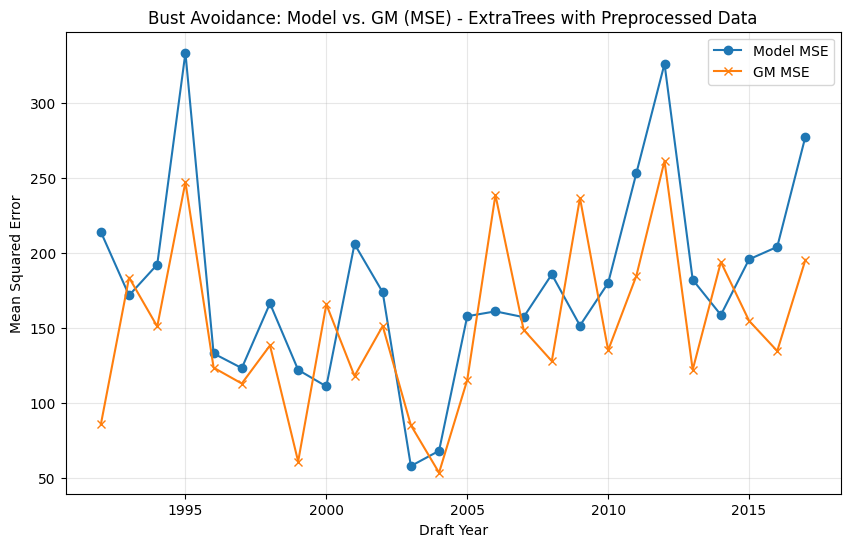

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_ext_p['Year'], evaluation_results_ext_p['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results_ext_p['Year'], evaluation_results_ext_p['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE) - ExtraTrees with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

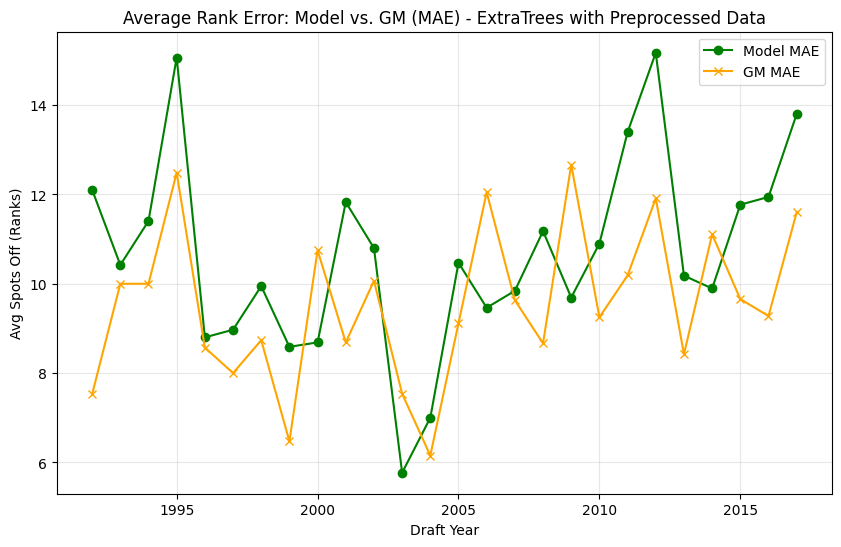

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_ext_p['Year'], evaluation_results_ext_p['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results_ext_p['Year'], evaluation_results_ext_p['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE) - ExtraTrees with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

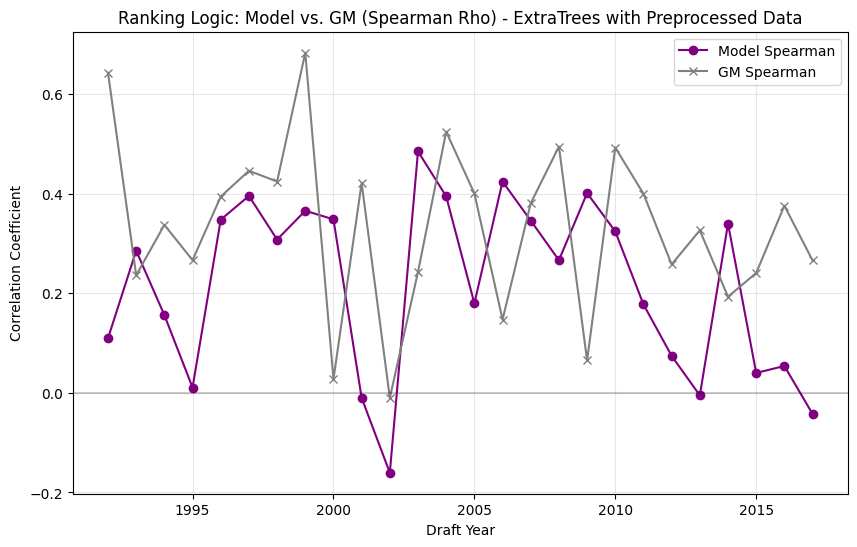

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_ext_p['Year'], evaluation_results_ext_p['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results_ext_p['Year'], evaluation_results_ext_p['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho) - ExtraTrees with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# KNN -- Preprocessed Data

KNN - Preprocessed Data

In [ ]:
ranked_forward_knn_p = forward_rank_by_year(dataset_final_preprocessed, model=make_knn_evo(dataset_final_preprocessed[NCAA_FEATURES_P]), features=NCAA_FEATURES_P, target="VORP")

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/di

In [ ]:
ranked_forward_knn_p['Pk_rank'] = ranked_forward_knn_p.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward_knn_p['Pk_rank'] = ranked_forward_knn_p['Pk_rank'].astype(int)

In [ ]:
evaluation_results_knn_p = evaluate_draft_years(ranked_forward_knn_p)

In [ ]:
evaluation_results_knn_p

,Year,MSE_Model,MSE_GM,MAE_Model,MAE_GM,Spearman_Model,Spearman_GM
0,1992,189.157895,88.263158,11.526316,7.631579,0.213481,0.633001
1,1993,174.052632,185.210526,10.157895,10.157895,0.276288,0.229894
2,1994,153.945946,150.702703,9.351351,10.000000,0.324798,0.339023
3,1995,272.311111,253.111111,13.822222,12.666667,0.192754,0.249671
4,1996,169.371429,124.628571,9.714286,8.628571,0.169748,0.389076
5,1997,174.400000,111.600000,10.685714,8.000000,0.145098,0.452941
6,1998,169.789474,138.421053,10.631579,8.736842,0.294015,0.424445
7,1999,109.705882,61.235294,7.882353,6.470588,0.430099,0.681895
8,2000,116.312500,166.062500,8.812500,10.750000,0.317815,0.026026
9,2001,206.914286,118.000000,12.114286,8.742857,-0.014286,0.421569


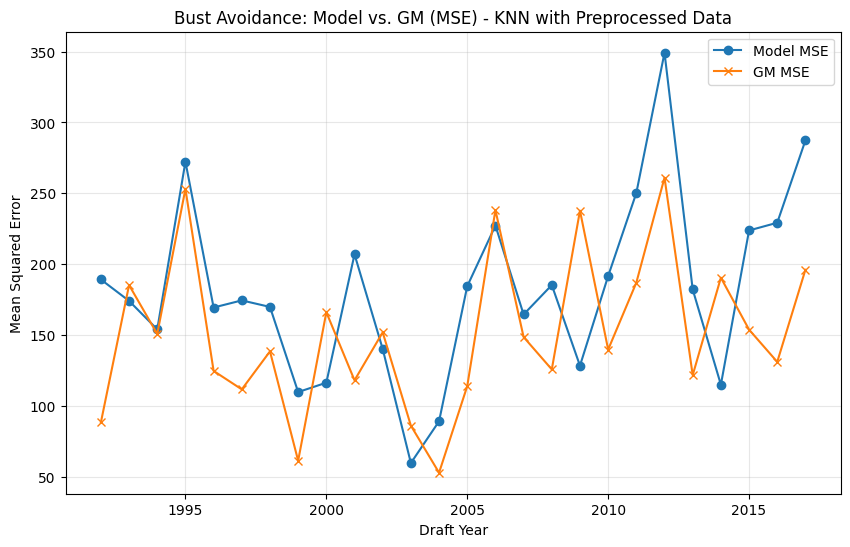

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_knn_p['Year'], evaluation_results_knn_p['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results_knn_p['Year'], evaluation_results_knn_p['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE) - KNN with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

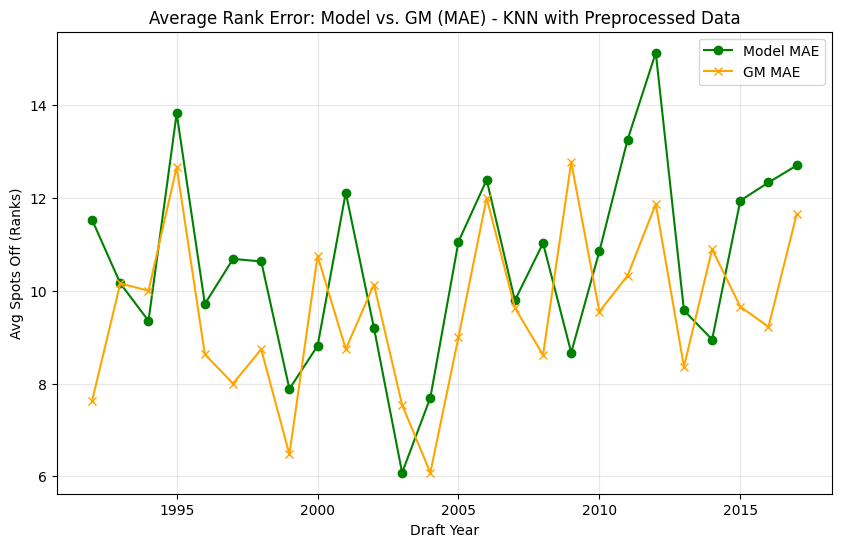

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_knn_p['Year'], evaluation_results_knn_p['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results_knn_p['Year'], evaluation_results_knn_p['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE) - KNN with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

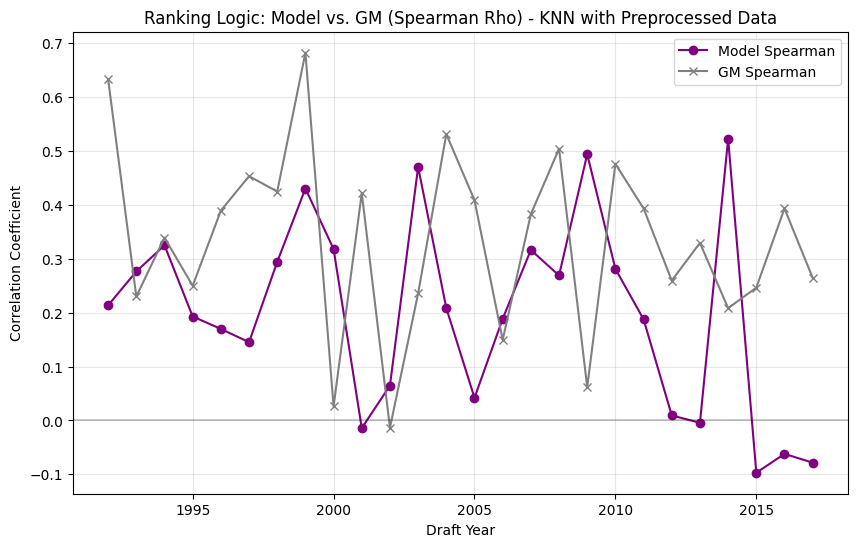

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_knn_p['Year'], evaluation_results_knn_p['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results_knn_p['Year'], evaluation_results_knn_p['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho) - KNN with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [ ]:
for idx, row in dataset_final[dataset_final['DraftYear']==2014].sort_values('Pk').iterrows():
  print(row['name'], row['college'], row['Pk'])

Andrew Wiggins University of Kansas 1
Jabari Parker Duke University 2
Aaron Gordon University of Arizona 4
Marcus Smart Oklahoma State University 6
Julius Randle University of Kentucky 7
Nik Stauskas University of Michigan 8
Noah Vonleh Indiana University 9
Elfrid Payton University of Louisiana at Lafayette 10
Doug McDermott Creighton University 11
Zach LaVine University of California, Los Angeles 13
T.J. Warren North Carolina State University 14
Adreian Payne Michigan State University 15
James Young University of Kentucky 17
Tyler Ennis Syracuse University 18
Gary Harris Michigan State University 19
Mitch McGary University of Michigan 21
Jordan Adams University of California, Los Angeles 22
Rodney Hood Mississippi State University, Duke University 23
Shabazz Napier University of Connecticut 24
P.J. Hairston University of North Carolina 26
C.J. Wilcox University of Washington 28
Kyle Anderson University of California, Los Angeles 30
K.J. McDaniels Clemson University 32
Joe Harris Unive

# MLP -- Preprocessed Data

MLP

In [ ]:
ranked_forward_mlp_p = forward_rank_by_year(dataset_final_preprocessed, model=make_mlp_evo(dataset_final_preprocessed[NCAA_FEATURES_P]), features=NCAA_FEATURES_P, target="VORP")

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sk

In [ ]:
ranked_forward_mlp_p['Pk_rank'] = ranked_forward_mlp_p.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward_mlp_p['Pk_rank'] = ranked_forward_mlp_p['Pk_rank'].astype(int)

In [ ]:
evaluation_results_mlp_p = evaluate_draft_years(ranked_forward_mlp_p)

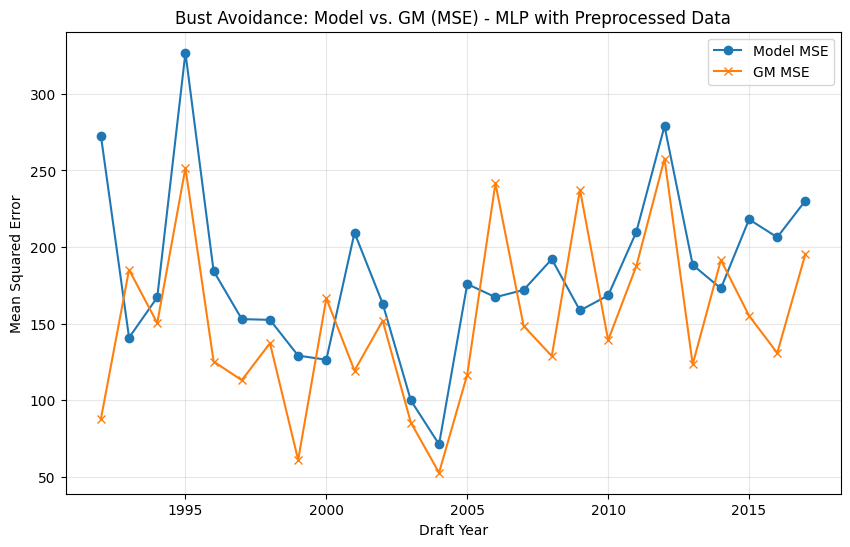

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_mlp_p['Year'], evaluation_results_mlp_p['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results_mlp_p['Year'], evaluation_results_mlp_p['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE) - MLP with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

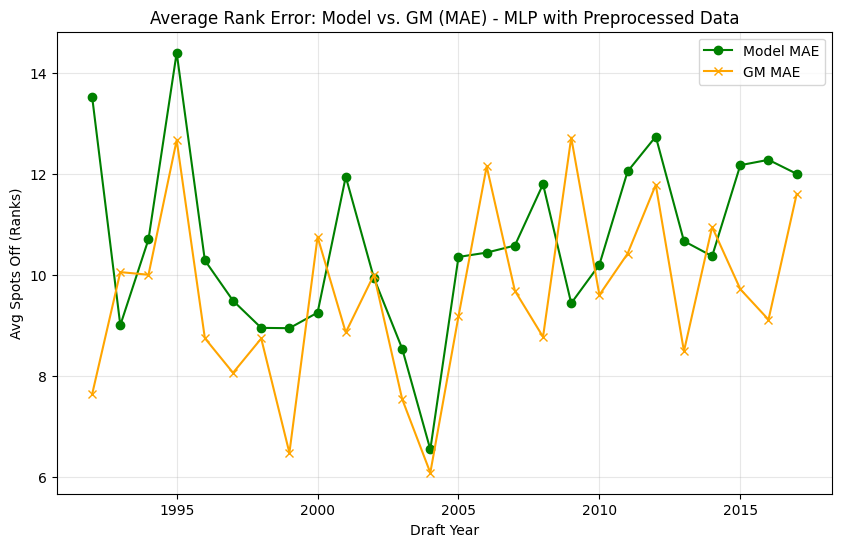

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_mlp_p['Year'], evaluation_results_mlp_p['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results_mlp_p['Year'], evaluation_results_mlp_p['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE) - MLP with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

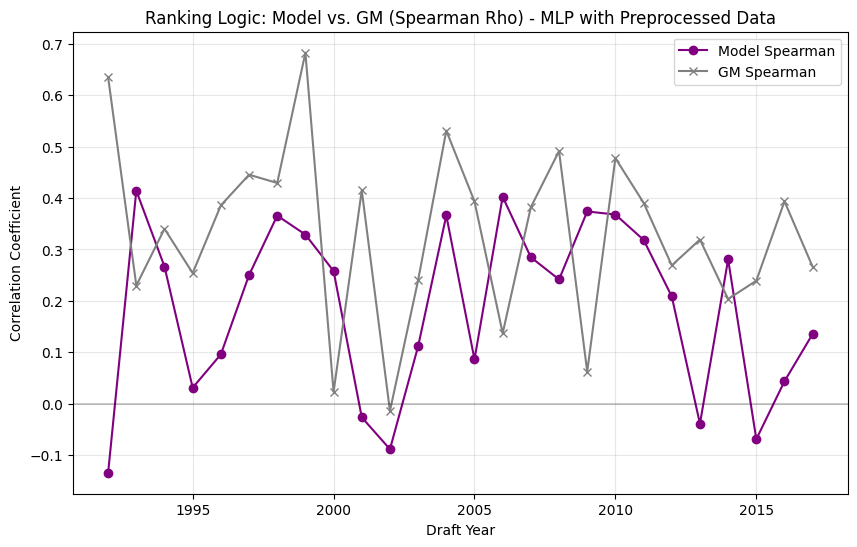

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_mlp_p['Year'], evaluation_results_mlp_p['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results_mlp_p['Year'], evaluation_results_mlp_p['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho) - MLP with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Third Iteration of Training Models -- Preprocessed Data, Smaller Feature Set, Physical Metadata

# Random Forests using Preprocessed data and Metadata

In [ ]:
NCAA_FEATURES_P2 = ['weight', 'height', 'position','NCAA__3ptpct',
       'NCAA_efgpct', 'NCAA_fgpct', 'NCAA_ft', 'NCAA_games', 'NCAA_ppg','NCAA_pts_per_40']

In [ ]:
ranked_forward_rf_p2 = forward_rank_by_year(dataset_final_preprocessed_pos, model=make_rf_evo(dataset_final_preprocessed_pos[NCAA_FEATURES_P2]), features=NCAA_FEATURES_P2, target="VORP")


/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/di

In [ ]:
ranked_forward_rf_p2['Pk_rank'] = ranked_forward_rf_p2.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward_rf_p2['Pk_rank'] = ranked_forward_rf_p2['Pk_rank'].astype(int)

In [ ]:
#evalyated
evaluation_results_rf_p2 = evaluate_draft_years(ranked_forward_rf_p2)

In [ ]:
evaluation_results_rf_p2

,Year,MSE_Model,MSE_GM,MAE_Model,MAE_GM,Spearman_Model,Spearman_GM
0,1992,263.894737,87.368421,12.789474,7.578947,-0.097275,0.636722
1,1993,170.526316,184.210526,10.368421,10.052632,0.290951,0.234052
2,1994,216.000000,150.432432,12.378378,10.000000,0.052632,0.340209
3,1995,272.400000,248.177778,13.066667,12.488889,0.192490,0.264295
4,1996,108.457143,123.885714,7.371429,8.742857,0.468347,0.392717
5,1997,150.342857,112.514286,9.828571,8.000000,0.263025,0.448459
6,1998,157.736842,138.421053,10.368421,8.736842,0.344130,0.424445
7,1999,143.588235,61.352941,9.705882,6.470588,0.254087,0.681283
8,2000,71.375000,167.187500,6.500000,10.750000,0.581378,0.019428
9,2001,170.000000,118.342857,11.200000,8.742857,0.166667,0.419888


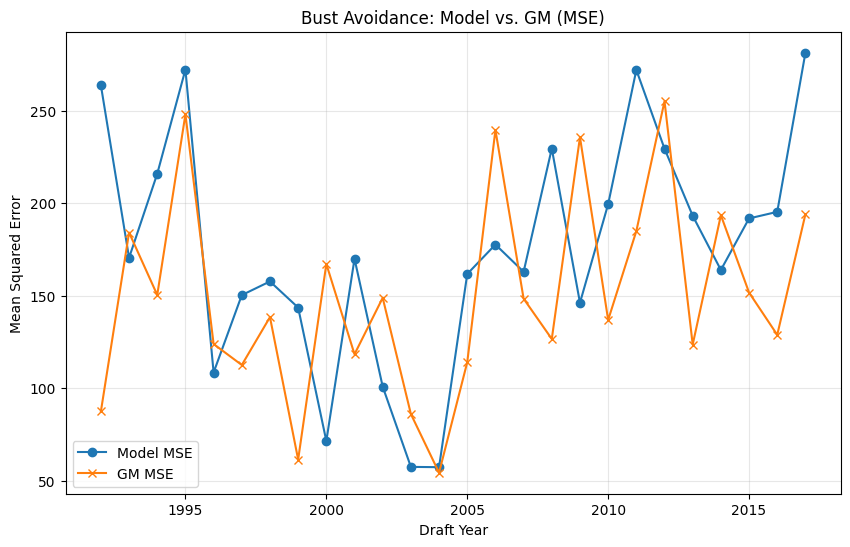

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_rf_p2['Year'], evaluation_results_rf_p2['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results_rf_p2['Year'], evaluation_results_rf_p2['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE)')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

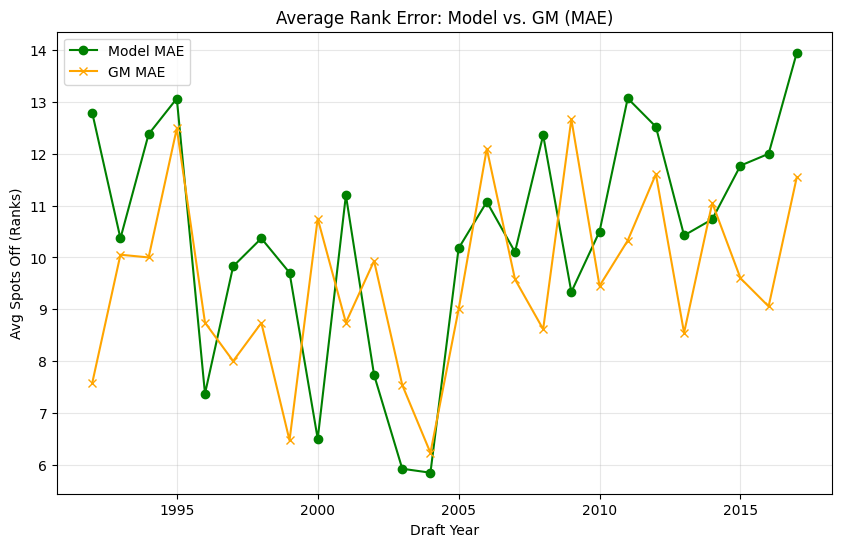

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_rf_p2['Year'], evaluation_results_rf_p2['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results_rf_p2['Year'], evaluation_results_rf_p2['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE)')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

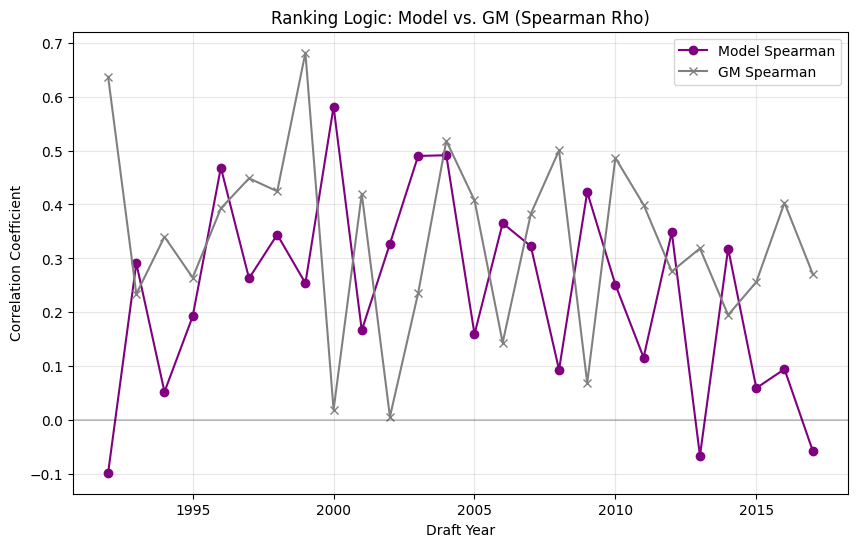

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_rf_p2['Year'], evaluation_results_rf_p2['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results_rf_p2['Year'], evaluation_results_rf_p2['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho)')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# XGBoost -- Preprocessed + Metadata

In [ ]:
ranked_forward_xgb_p2 = forward_rank_by_year(dataset_final_preprocessed_pos, model=make_xgb_evo(dataset_final_preprocessed_pos[NCAA_FEATURES_P2]), features=NCAA_FEATURES_P2, target="VORP")

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/di

In [ ]:
ranked_forward_xgb_p2['Pk_rank'] = ranked_forward_xgb_p2.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward_xgb_p2['Pk_rank'] = ranked_forward_xgb_p2['Pk_rank'].astype(int)

In [ ]:
evaluation_results_xgb_p2 = evaluate_draft_years(ranked_forward_xgb_p2)

In [ ]:
evaluation_results_xgb_p2

,Year,MSE_Model,MSE_GM,MAE_Model,MAE_GM,Spearman_Model,Spearman_GM
0,1992,259.052632,89.052632,12.368421,7.684211,-0.077142,0.629719
1,1993,195.842105,185.526316,11.578947,10.105263,0.185688,0.228581
2,1994,201.027027,150.162162,11.297297,10.000000,0.118303,0.341394
3,1995,323.866667,251.822222,14.977778,12.711111,0.039921,0.253491
4,1996,115.085714,124.000000,8.228571,8.628571,0.435854,0.392157
5,1997,147.942857,111.885714,9.600000,8.000000,0.274790,0.451541
6,1998,147.947368,137.105263,9.842105,8.736842,0.384834,0.429916
7,1999,174.941176,61.294118,10.294118,6.470588,0.091215,0.681589
8,2000,93.687500,166.937500,6.937500,10.750000,0.450513,0.020894
9,2001,176.114286,119.142857,11.028571,8.857143,0.136695,0.415966


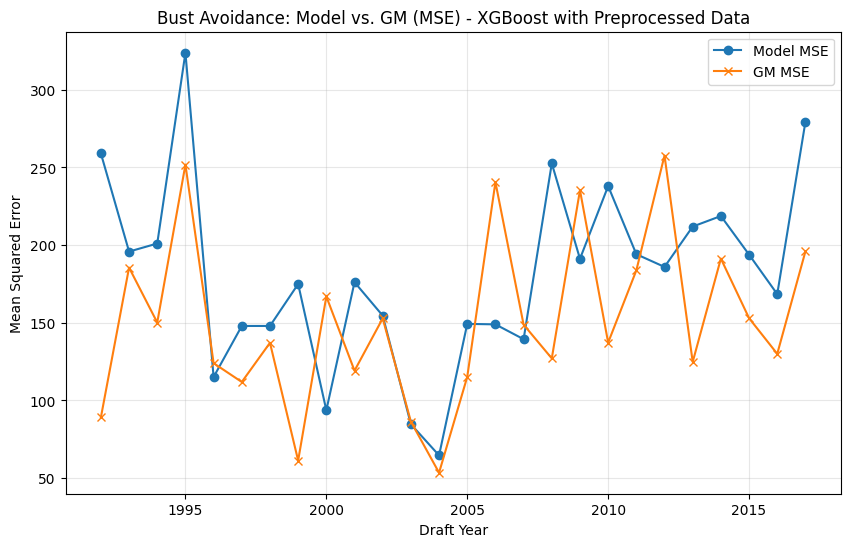

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_xgb_p2['Year'], evaluation_results_xgb_p2['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results_xgb_p2['Year'], evaluation_results_xgb_p2['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE) - XGBoost with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

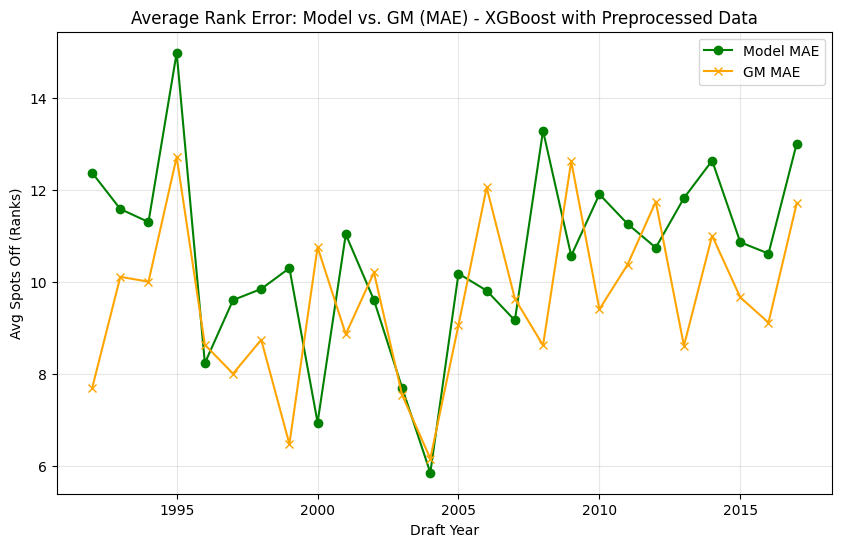

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_xgb_p2['Year'], evaluation_results_xgb_p2['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results_xgb_p2['Year'], evaluation_results_xgb_p2['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE) - XGBoost with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

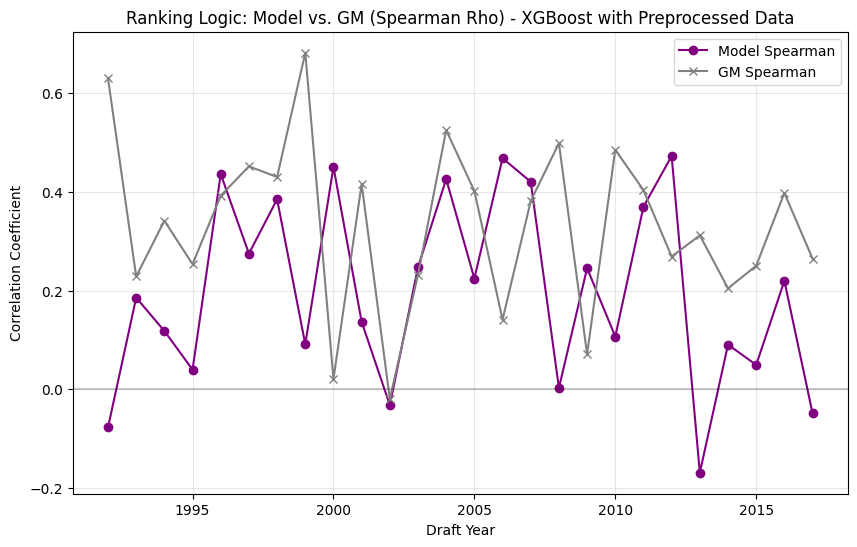

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_xgb_p2['Year'], evaluation_results_xgb_p2['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results_xgb_p2['Year'], evaluation_results_xgb_p2['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho) - XGBoost with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# LightGBM -- Preprocessed + Metadata

In [ ]:
ranked_forward_lgbm_p2 = forward_rank_by_year(dataset_final_preprocessed_pos, model=make_lgbm_evo(dataset_final_preprocessed_pos[NCAA_FEATURES_P2]), features=NCAA_FEATURES_P2, target="VORP")

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: 

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 34, number of used features: 0
[LightGBM] [Info] Start training from score 5.870588
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarn

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 545
[LightGBM] [Info] Number of data points in the train set: 300, number of used features: 19
[LightGBM] [Info] Start training from score 6.122333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarn

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 716
[LightGBM] [Info] Number of data points in the train set: 431, number of used features: 23
[LightGBM] [Info] Start training from score 5.759861
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 792
[LightGBM] [Info] Number of data points in the train set: 483, number of used features: 24
[LightGBM] [Info] Start training from score 5.956315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005945 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 862
[LightGBM] [Info] Number of data points in the train set: 517, number of used features: 24
[LightGBM] [Info] Start training from score 6.015474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000098 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 912
[LightGBM] [Info] Number of data points in the train set: 558, number of used features: 24
[LightGBM] [Info] Start training from score 5.936201
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 994
[LightGBM] [Info] Number of data points in the train set: 635, number of used features: 25
[LightGBM] [Info] Start training from score 5.948031
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1098
[LightGBM] [Info] Number of data points in the train set: 714, number of used features: 27
[LightGBM] [Info] Start training from score 5.984454
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000159 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1161
[LightGBM] [Info] Number of data points in the train set: 836, number of used features: 27
[LightGBM] [Info] Start training from score 5.712321
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1195
[LightGBM] [Info] Number of data points in the train set: 909, number of used features: 27
[LightGBM] [Info] Start training from score 5.466337


/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarn

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1208
[LightGBM] [Info] Number of data points in the train set: 945, number of used features: 27
[LightGBM] [Info] Start training from score 5.326032


/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


In [ ]:
ranked_forward_lgbm_p2['Pk_rank'] = ranked_forward_lgbm_p2.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward_lgbm_p2['Pk_rank'] = ranked_forward_lgbm_p2['Pk_rank'].astype(int)

In [ ]:
evaluation_results_lgbm_p2 = evaluate_draft_years(ranked_forward_lgbm_p2)

In [ ]:
evaluation_results_lgbm_p2

,Year,MSE_Model,MSE_GM,MAE_Model,MAE_GM,Spearman_Model,Spearman_GM
0,1992,216.684211,87.421053,12.421053,7.526316,0.099026,0.636503
1,1993,137.842105,185.263158,9.210526,10.052632,0.426852,0.229675
2,1994,255.351351,150.324324,13.675676,10.000000,-0.119962,0.340683
3,1995,351.511111,243.555556,15.022222,12.355556,-0.042029,0.277997
4,1996,156.400000,124.742857,9.942857,8.685714,0.233333,0.388515
5,1997,88.342857,112.971429,7.142857,8.000000,0.566947,0.446218
6,1998,188.210526,138.421053,10.842105,8.736842,0.217420,0.424445
7,1999,160.294118,61.470588,9.588235,6.470588,0.167303,0.680672
8,2000,95.062500,166.062500,7.875000,10.750000,0.442449,0.026026
9,2001,198.685714,116.800000,11.828571,8.685714,0.026050,0.427451


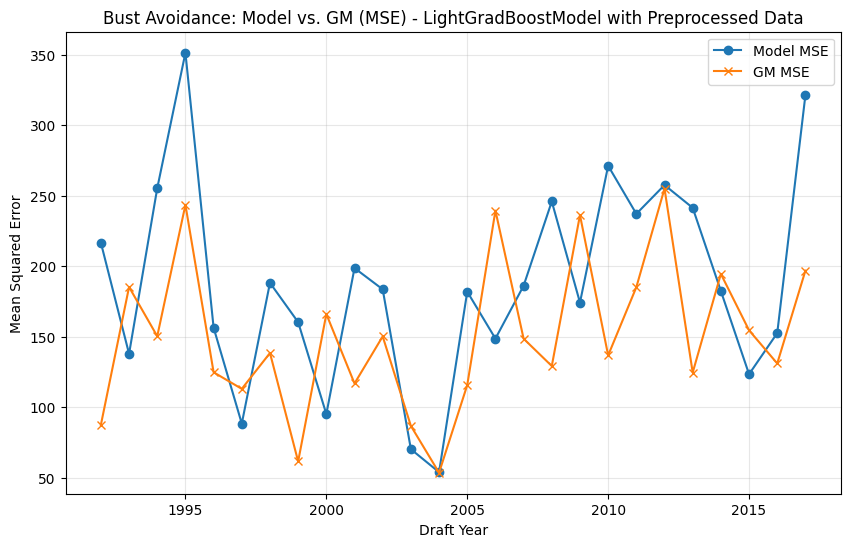

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_lgbm_p2['Year'], evaluation_results_lgbm_p2['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results_lgbm_p2['Year'], evaluation_results_lgbm_p2['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE) - LightGradBoostModel with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

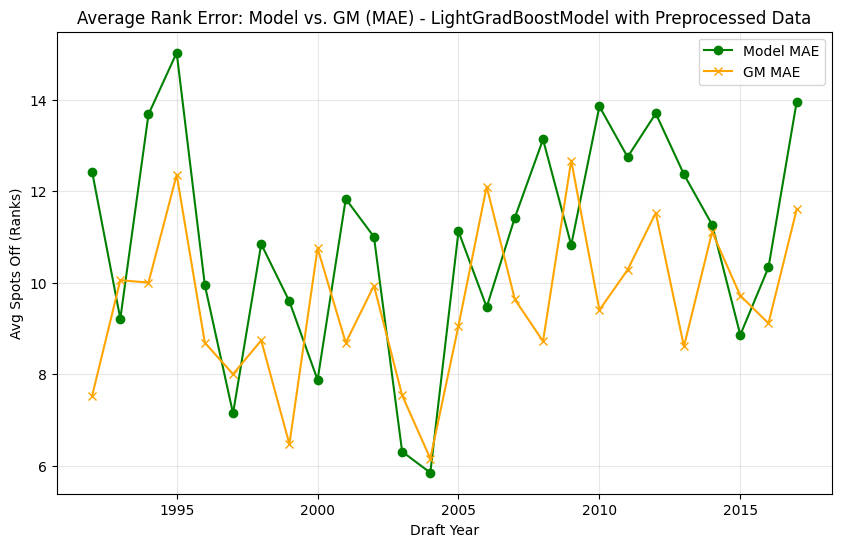

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_lgbm_p2['Year'], evaluation_results_lgbm_p2['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results_lgbm_p2['Year'], evaluation_results_lgbm_p2['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE) - LightGradBoostModel with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

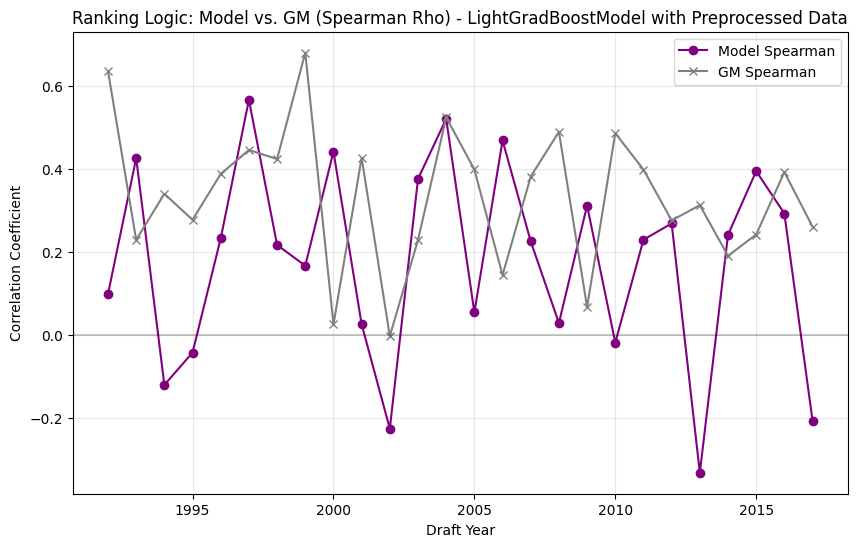

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_lgbm_p2['Year'], evaluation_results_lgbm_p2['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results_lgbm_p2['Year'], evaluation_results_lgbm_p2['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho) - LightGradBoostModel with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# ExtraTrees -- Preprocessed + Metadata

In [ ]:
ranked_forward_ext_p2 = forward_rank_by_year(dataset_final_preprocessed_pos, model=make_ext_evo(dataset_final_preprocessed_pos[NCAA_FEATURES_P2]), features=NCAA_FEATURES_P2, target="VORP")

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/di

In [ ]:
ranked_forward_ext_p2['Pk_rank'] = ranked_forward_ext_p2.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward_ext_p2['Pk_rank'] = ranked_forward_ext_p2['Pk_rank'].astype(int)

In [ ]:
evaluation_results_ext_p2 = evaluate_draft_years(ranked_forward_ext_p2)

In [ ]:
evaluation_results_ext_p2

,Year,MSE_Model,MSE_GM,MAE_Model,MAE_GM,Spearman_Model,Spearman_GM
0,1992,233.105263,89.052632,11.526316,7.631579,0.030747,0.629719
1,1993,254.263158,187.684211,13.894737,10.368421,-0.057227,0.219608
2,1994,169.783784,150.972973,10.594595,10.000000,0.255334,0.337838
3,1995,250.533333,249.911111,12.444444,12.533333,0.257312,0.259157
4,1996,161.771429,123.028571,10.342857,8.685714,0.207003,0.396919
5,1997,152.342857,112.342857,10.057143,8.000000,0.253221,0.449300
6,1998,178.157895,137.157895,10.631579,8.736842,0.259219,0.429697
7,1999,138.352941,60.941176,9.529412,6.470588,0.281283,0.683422
8,2000,76.500000,167.062500,7.000000,10.750000,0.551320,0.020161
9,2001,175.428571,118.571429,11.314286,8.800000,0.140056,0.418768


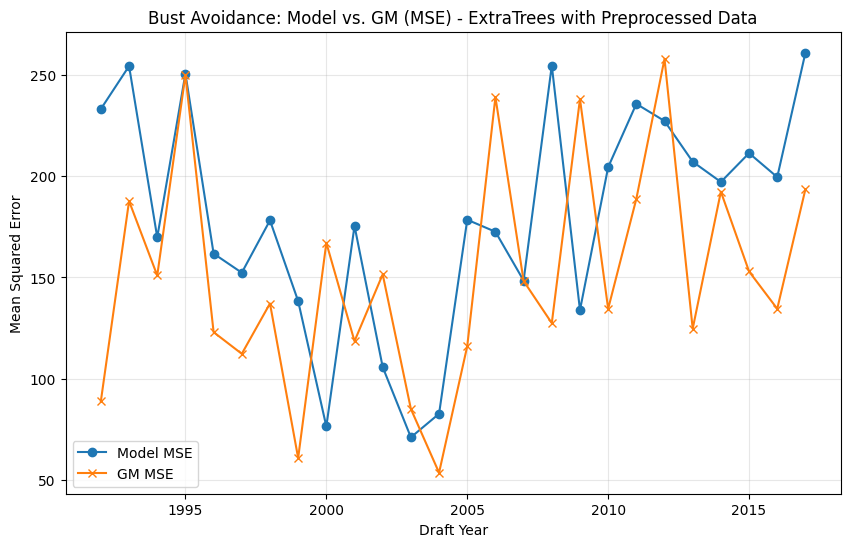

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_ext_p2['Year'], evaluation_results_ext_p2['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results_ext_p2['Year'], evaluation_results_ext_p2['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE) - ExtraTrees with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

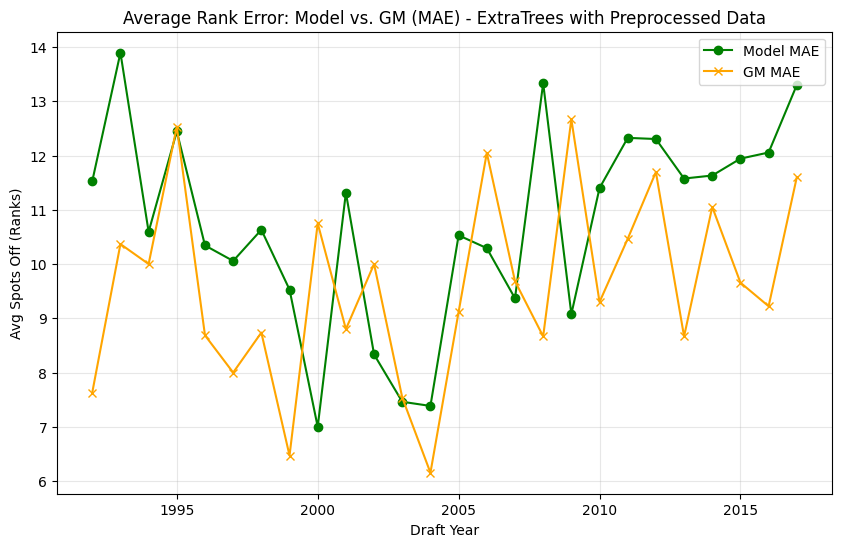

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_ext_p2['Year'], evaluation_results_ext_p2['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results_ext_p2['Year'], evaluation_results_ext_p2['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE) - ExtraTrees with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

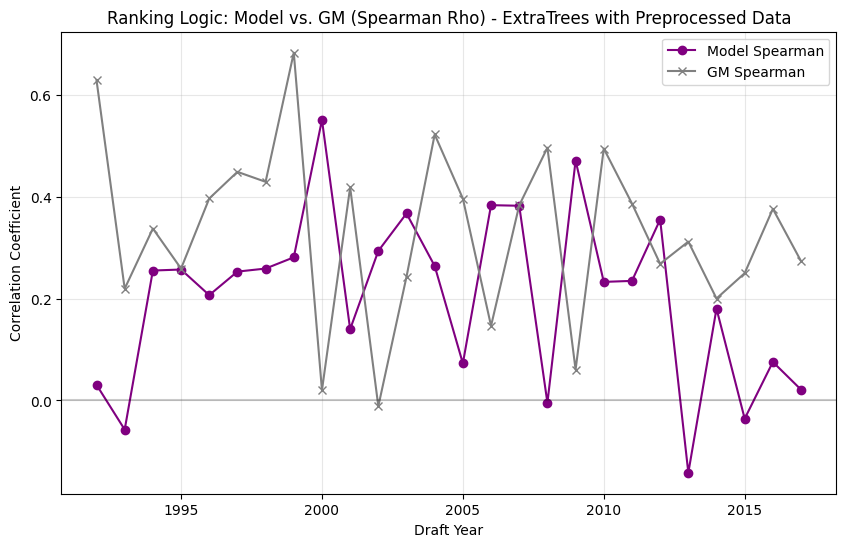

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_ext_p2['Year'], evaluation_results_ext_p2['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results_ext_p2['Year'], evaluation_results_ext_p2['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho) - ExtraTrees with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# KNN -- Preprocessed + Metadata

In [ ]:
ranked_forward_knn_p2 = forward_rank_by_year(dataset_final_preprocessed_pos, model=make_knn_evo(dataset_final_preprocessed_pos[NCAA_FEATURES_P2]), features=NCAA_FEATURES_P2, target="VORP")

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/di

In [ ]:
ranked_forward_knn_p2['Pk_rank'] = ranked_forward_knn_p2.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward_knn_p2['Pk_rank'] = ranked_forward_knn_p2['Pk_rank'].astype(int)

In [ ]:
evaluation_results_knn_p2 = evaluate_draft_years(ranked_forward_knn_p2)

In [ ]:
evaluation_results_knn_p2

,Year,MSE_Model,MSE_GM,MAE_Model,MAE_GM,Spearman_Model,Spearman_GM
0,1992,255.684211,86.315789,13.473684,7.526316,-0.063136,0.641099
1,1993,156.947368,188.157895,10.000000,10.157895,0.347412,0.217639
2,1994,223.027027,150.702703,11.891892,10.000000,0.021811,0.339023
3,1995,335.022222,251.066667,15.244444,12.533333,0.006851,0.255731
4,1996,141.485714,123.942857,9.714286,8.571429,0.306443,0.392437
5,1997,148.342857,113.714286,9.714286,8.057143,0.272829,0.442577
6,1998,197.526316,138.368421,11.052632,8.736842,0.178685,0.424664
7,1999,179.352941,61.117647,10.647059,6.470588,0.068296,0.682506
8,2000,107.625000,165.750000,8.250000,10.750000,0.368768,0.027859
9,2001,209.771429,120.171429,12.342857,8.857143,-0.028291,0.410924


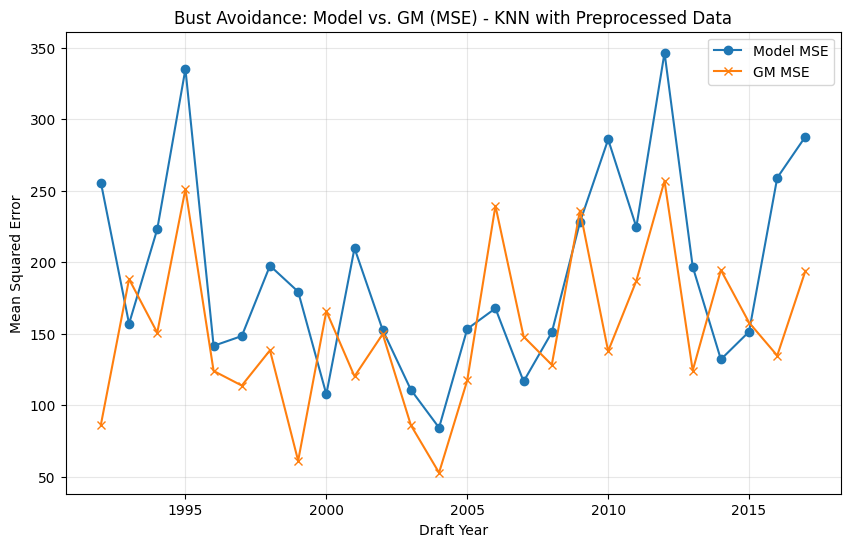

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_knn_p2['Year'], evaluation_results_knn_p2['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results_knn_p2['Year'], evaluation_results_knn_p2['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE) - KNN with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

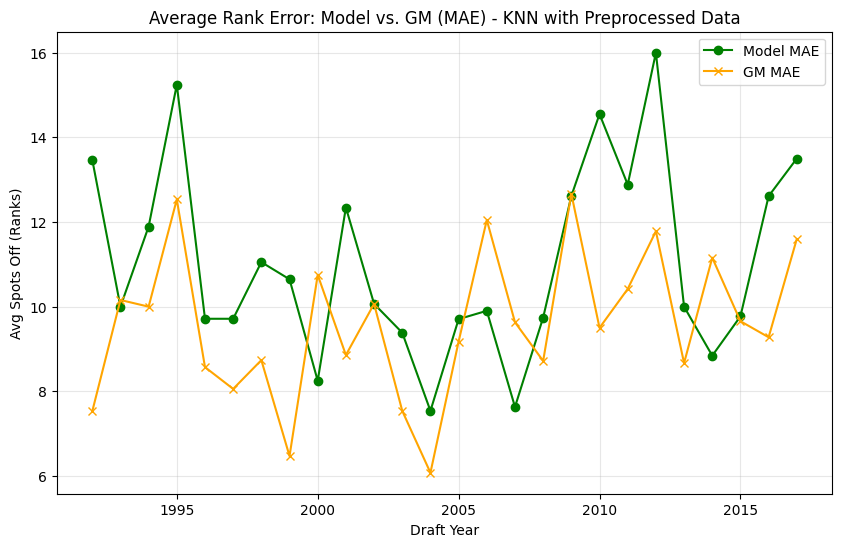

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_knn_p2['Year'], evaluation_results_knn_p2['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results_knn_p2['Year'], evaluation_results_knn_p2['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE) - KNN with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

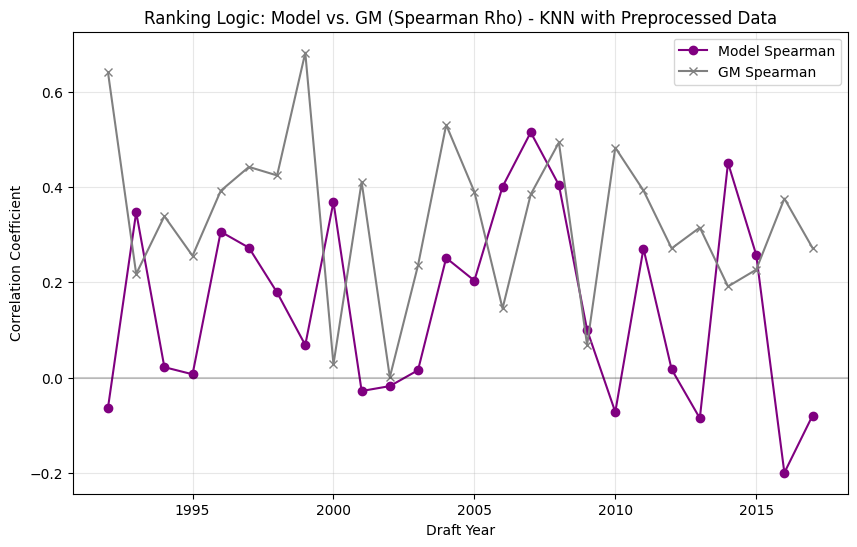

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_knn_p2['Year'], evaluation_results_knn_p2['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results_knn_p2['Year'], evaluation_results_knn_p2['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho) - KNN with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# MLP -- Preprocessed + Metadata

In [ ]:
ranked_forward_mlp_p2 = forward_rank_by_year(dataset_final_preprocessed_pos, model=make_mlp_evo(dataset_final_preprocessed_pos[NCAA_FEATURES_P2]), features=NCAA_FEATURES_P2, target="VORP")

/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['NCAA_efgpct']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sk

In [ ]:
ranked_forward_mlp_p2['Pk_rank'] = ranked_forward_mlp_p2.groupby("DraftYear")['Pk'].rank(method='first')
ranked_forward_mlp_p2['Pk_rank'] = ranked_forward_mlp_p2['Pk_rank'].astype(int)

In [ ]:
evaluation_results_mlp_p2 = evaluate_draft_years(ranked_forward_mlp_p2)

In [ ]:
evaluation_results_mlp_p2

,Year,MSE_Model,MSE_GM,MAE_Model,MAE_GM,Spearman_Model,Spearman_GM
0,1992,269.157895,87.315789,13.473684,7.526316,-0.119160,0.636941
1,1993,118.578947,185.368421,8.842105,10.105263,0.506948,0.229237
2,1994,202.810811,150.702703,11.621622,10.000000,0.110479,0.339023
3,1995,334.444444,254.844444,15.200000,12.711111,0.008564,0.244532
4,1996,196.285714,124.342857,11.028571,8.628571,0.037815,0.390476
5,1997,186.742857,113.257143,11.200000,8.057143,0.084594,0.444818
6,1998,179.947368,138.315789,10.105263,8.736842,0.251778,0.424882
7,1999,170.294118,61.411765,10.647059,6.529412,0.115355,0.680978
8,2000,92.250000,165.437500,7.312500,10.750000,0.458944,0.029692
9,2001,150.571429,120.228571,10.114286,8.800000,0.261905,0.410644


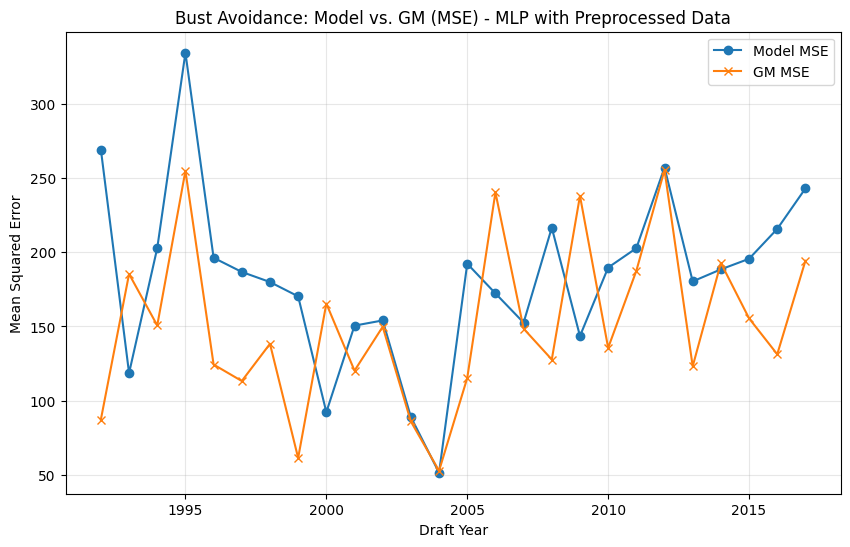

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_mlp_p2['Year'], evaluation_results_mlp_p2['MSE_Model'], label='Model MSE', marker='o')
plt.plot(evaluation_results_mlp_p2['Year'], evaluation_results_mlp_p2['MSE_GM'], label='GM MSE', marker='x')
plt.title('Bust Avoidance: Model vs. GM (MSE) - MLP with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

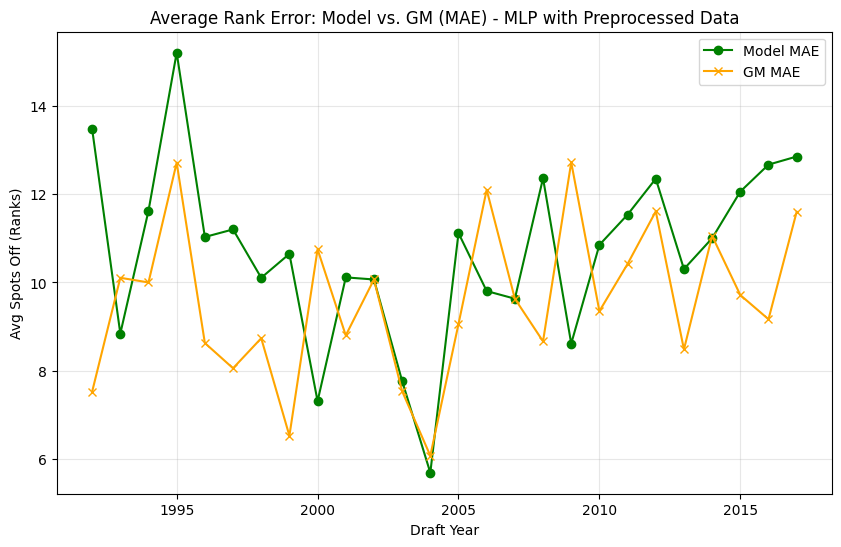

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_mlp_p2['Year'], evaluation_results_mlp_p2['MAE_Model'], label='Model MAE', color='green', marker='o')
plt.plot(evaluation_results_mlp_p2['Year'], evaluation_results_mlp_p2['MAE_GM'], label='GM MAE', color='orange', marker='x')
plt.title('Average Rank Error: Model vs. GM (MAE) - MLP with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Avg Spots Off (Ranks)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

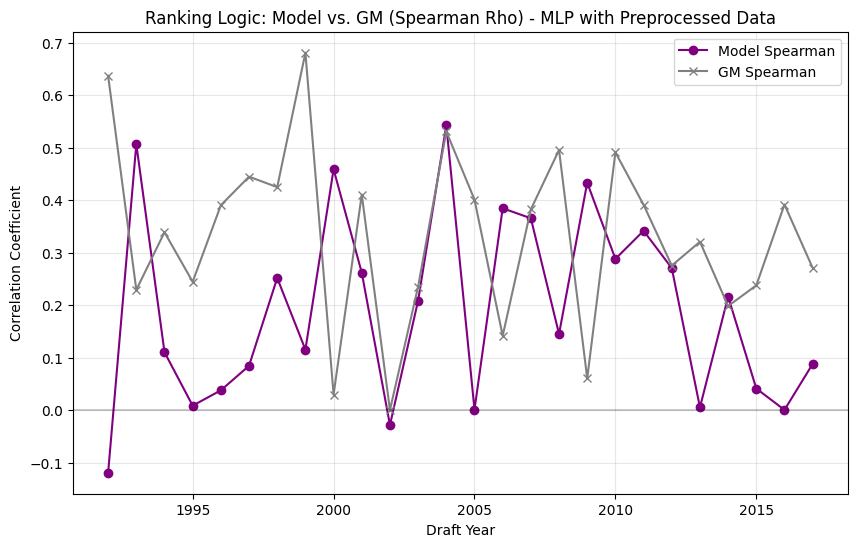

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(evaluation_results_mlp_p2['Year'], evaluation_results_mlp_p2['Spearman_Model'], label='Model Spearman', color='purple', marker='o')
plt.plot(evaluation_results_mlp_p2['Year'], evaluation_results_mlp_p2['Spearman_GM'], label='GM Spearman', color='grey', marker='x')
plt.axhline(y=0, color='black', alpha=0.2) # Zero correlation line
plt.title('Ranking Logic: Model vs. GM (Spearman Rho) - MLP with Preprocessed Data')
plt.xlabel('Draft Year')
plt.ylabel('Correlation Coefficient')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Summary Graphs

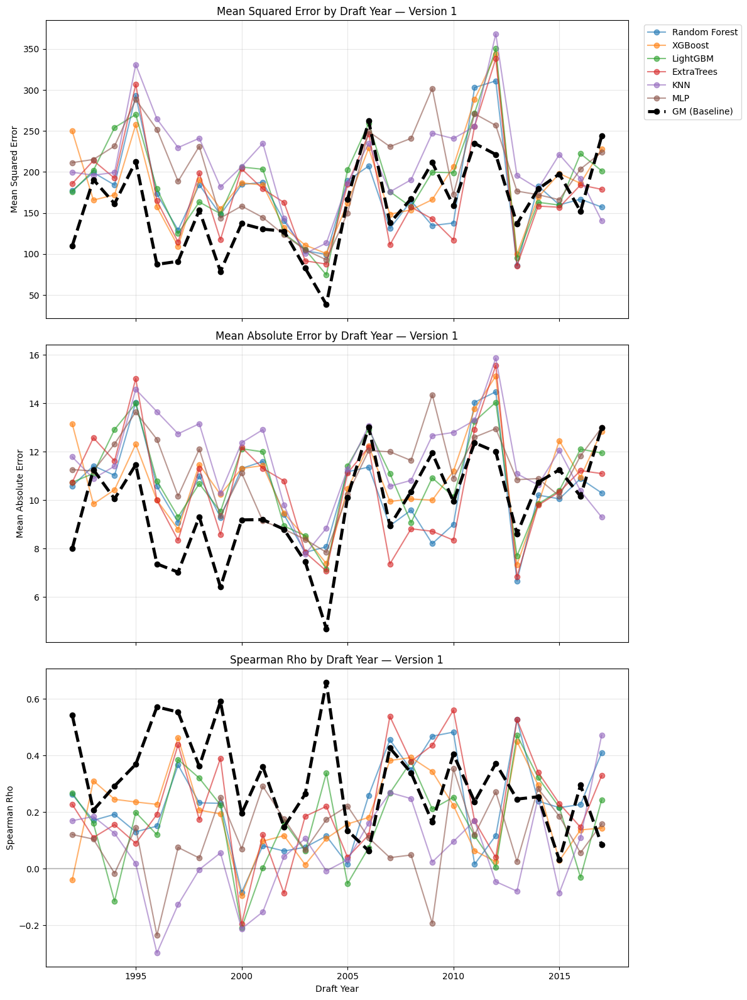

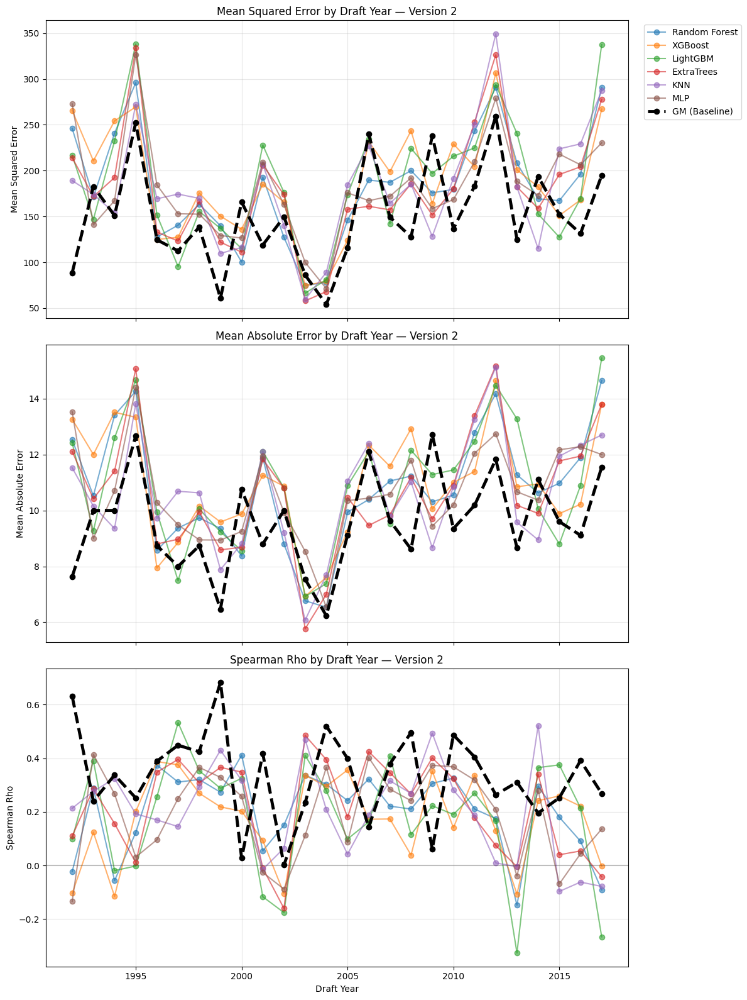

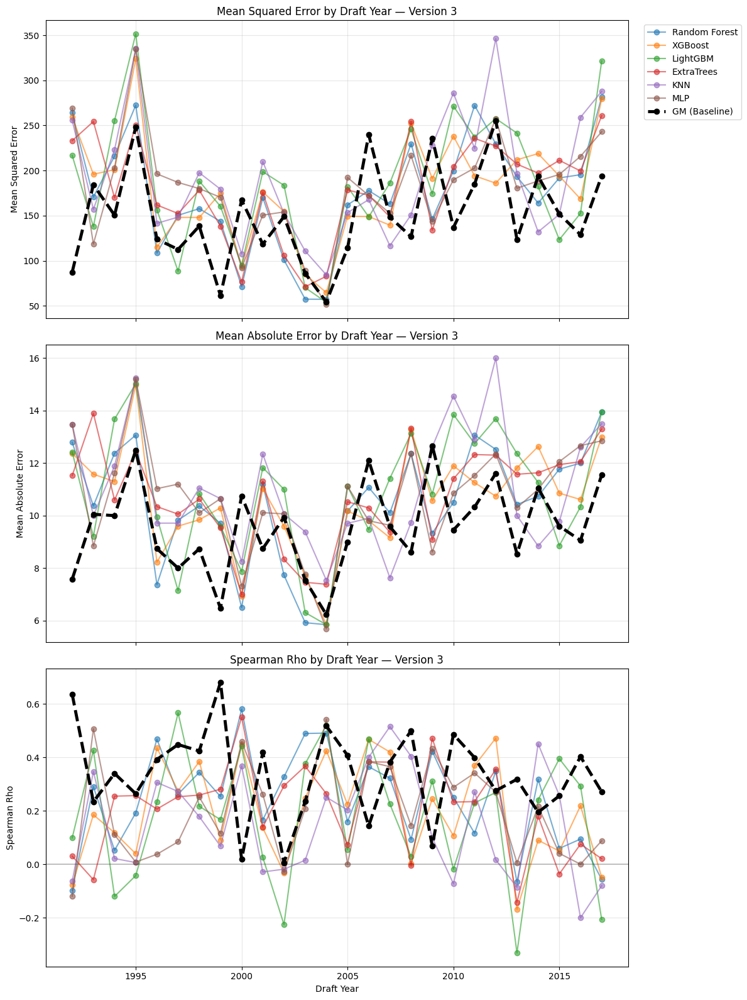

In [ ]:
metrics = {
    "MSE_Model": ("MSE_GM", "Mean Squared Error"),
    "MAE_Model": ("MAE_GM", "Mean Absolute Error"),
    "Spearman_Model": ("Spearman_GM", "Spearman Rho")
}

version_results = {
    "Version 1": {
        "Random Forest": evaluation_results,
        "XGBoost": evaluation_results_xgb,
        "LightGBM": evaluation_results_lgbm,
        "ExtraTrees": evaluation_results_ext,
        "KNN": evaluation_results_knn,
        "MLP": evaluation_results_mlp
    },
    "Version 2": {
        "Random Forest": evaluation_results_rf_p,
        "XGBoost": evaluation_results_xgb_p,
        "LightGBM": evaluation_results_lgbm_p,
        "ExtraTrees": evaluation_results_ext_p,
        "KNN": evaluation_results_knn_p,
        "MLP": evaluation_results_mlp_p
    },
    "Version 3": {
        "Random Forest": evaluation_results_rf_p2,
        "XGBoost": evaluation_results_xgb_p2,
        "LightGBM": evaluation_results_lgbm_p2,
        "ExtraTrees": evaluation_results_ext_p2,
        "KNN": evaluation_results_knn_p2,
        "MLP": evaluation_results_mlp_p2
    }
}

for version_name, model_dict in version_results.items():
    fig, axes = plt.subplots(3, 1, figsize=(12, 16), sharex=True)

    for ax, (model_col, (gm_col, metric_label)) in zip(axes, metrics.items()):

        # --- Plot all models ---
        for model_name, df in model_dict.items():
            df_sorted = df.sort_values("Year")
            ax.plot(
                df_sorted["Year"],
                df_sorted[model_col],
                marker="o",
                alpha=0.6,
                linewidth=1.5,
                label=model_name
            )

        # --- Plot GM baseline (only once, use any df since GM is same) ---
        sample_df = list(model_dict.values())[0].sort_values("Year")

        ax.plot(
            sample_df["Year"],
            sample_df[gm_col],
            color="black",
            linewidth=3.5,          # thicker
            linestyle="--",         # dashed (or use solid if you prefer)
            marker="o",
            markersize=6,
            label="GM (Baseline)"
        )

        ax.set_title(f"{metric_label} by Draft Year — {version_name}")
        ax.set_ylabel(metric_label)
        ax.grid(True, alpha=0.3)

        if model_col == "Spearman_Model":
            ax.axhline(y=0, color="black", alpha=0.2)

    axes[-1].set_xlabel("Draft Year")

    # Move legend outside for readability
    axes[0].legend(bbox_to_anchor=(1.02, 1), loc="upper left")

    plt.tight_layout()
    plt.show()

In [ ]:


summary_rows = []

for version_name, model_dict in version_results.items():
    for model_name, df in model_dict.items():
        summary_rows.append({
            "Version": version_name,
            "Model": model_name,
            "Avg_MSE": df["MSE_Model"].mean(),
            "Avg_MAE": df["MAE_Model"].mean(),
            "Avg_Spearman": df["Spearman_Model"].mean()
        })

summary_df = pd.DataFrame(summary_rows)

# 1. Calculate GM Averages (Assumes GM metrics are in your version_results)
# We only need to pull from one model in each version because GM scores are the same
gm_stats = []
for ver in ["Version 1", "Version 2", "Version 3"]:
    # Grab the first available model dataframe to get GM stats
    first_model_df = list(version_results[ver].values())[0]
    gm_stats.append({
        "Version": ver,
        "Model": "NBA GMs (Baseline)",
        "Avg_MSE": first_model_df["MSE_GM"].mean(),
        "Avg_MAE": first_model_df["MAE_GM"].mean(),
        "Avg_Spearman": first_model_df["Spearman_GM"].mean()
    })

# 2. Add GM Baseline to your existing summary_df
full_summary = pd.concat([summary_df, pd.DataFrame(gm_stats)], ignore_index=True)
full_summary

,Version,Model,Avg_MSE,Avg_MAE,Avg_Spearman
0,Version 1,Random Forest,174.458101,10.391957,0.222301
1,Version 1,XGBoost,182.788832,10.790171,0.189062
2,Version 1,LightGBM,188.149576,10.874343,0.169632
3,Version 1,ExtraTrees,174.495856,10.453828,0.226355
4,Version 1,KNN,210.420884,11.696073,0.059057
5,Version 1,MLP,200.099351,11.206855,0.113441
6,Version 2,Random Forest,182.408483,10.768365,0.200428
7,Version 2,XGBoost,188.102341,10.925953,0.172746
8,Version 2,LightGBM,187.439434,10.932546,0.177548
9,Version 2,ExtraTrees,179.451997,10.657704,0.216156


In [ ]:
pivoted_df = full_summary.pivot(index="Model", columns="Version", values=["Avg_MSE", "Avg_MAE", "Avg_Spearman"])

# 4. Create the String-Formatted Table (P1 / P2 / P3)
final_report = pd.DataFrame(index=pivoted_df.index)

# We map the raw columns to your preferred "Thesis-Ready" headers
metrics_map = {
    "Avg_MSE": "MSE (P1 / P2 / P3)",
    "Avg_MAE": "MAE (P1 / P2 / P3)",
    "Avg_Spearman": "Spearman (P1 / P2 / P3)"
}

for raw_col, display_name in metrics_map.items():
    # This combines the floats into one clean string per cell
    final_report[display_name] = (
        pivoted_df[raw_col]["Version 1"].round(2).astype(str) + " / " +
        pivoted_df[raw_col]["Version 2"].round(2).astype(str) + " / " +
        pivoted_df[raw_col]["Version 3"].round(2).astype(str)
    )

# 5. Clean up: Sort so NBA GMs are at the top or bottom for comparison
final_report = final_report.sort_index()
final_report

,MSE (P1 / P2 / P3),MAE (P1 / P2 / P3),Spearman (P1 / P2 / P3)
Model,,,
ExtraTrees,174.5 / 179.45 / 180.04,10.45 / 10.66 / 10.76,0.23 / 0.22 / 0.21
KNN,210.42 / 182.42 / 192.41,11.7 / 10.59 / 11.04,0.06 / 0.2 / 0.15
LightGBM,188.15 / 187.44 / 187.7,10.87 / 10.93 / 10.91,0.17 / 0.18 / 0.18
MLP,200.1 / 182.16 / 182.52,11.21 / 10.64 / 10.7,0.11 / 0.19 / 0.19
NBA GMs (Baseline),156.58 / 151.26 / 150.56,9.72 / 9.58 / 9.55,0.31 / 0.33 / 0.34
Random Forest,174.46 / 182.41 / 174.82,10.39 / 10.77 / 10.43,0.22 / 0.2 / 0.24
XGBoost,182.79 / 188.1 / 181.21,10.79 / 10.93 / 10.58,0.19 / 0.17 / 0.2


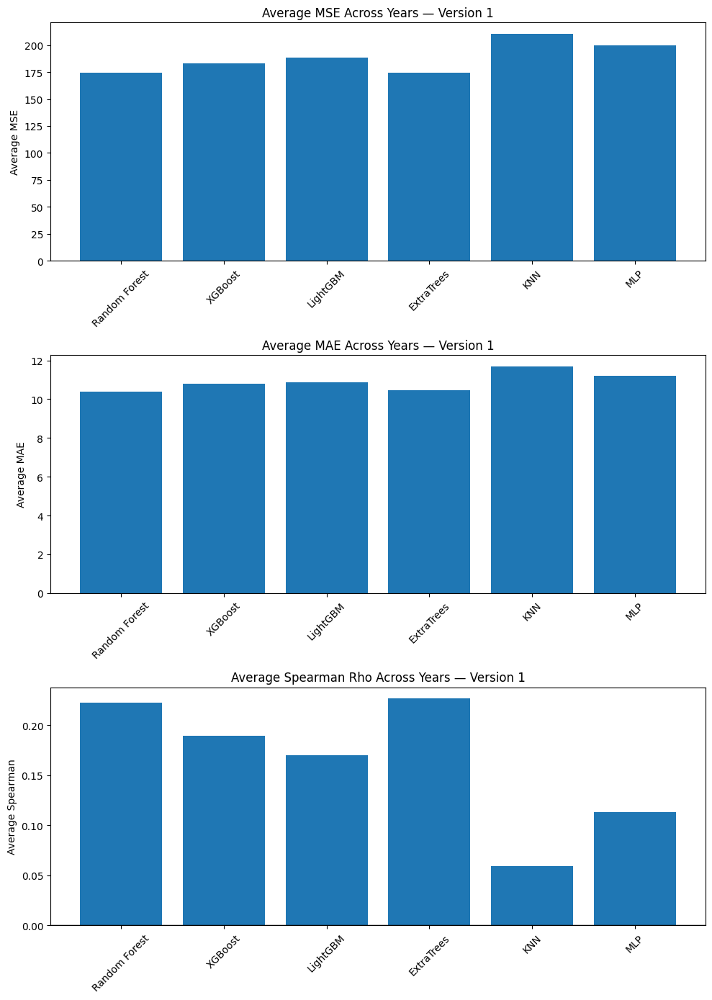

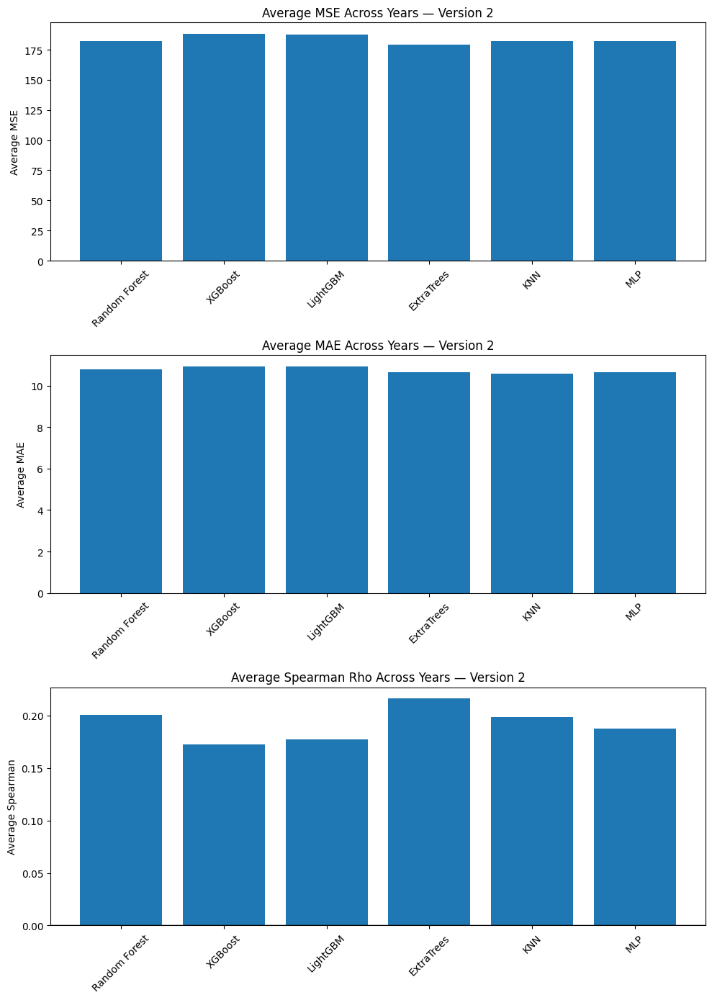

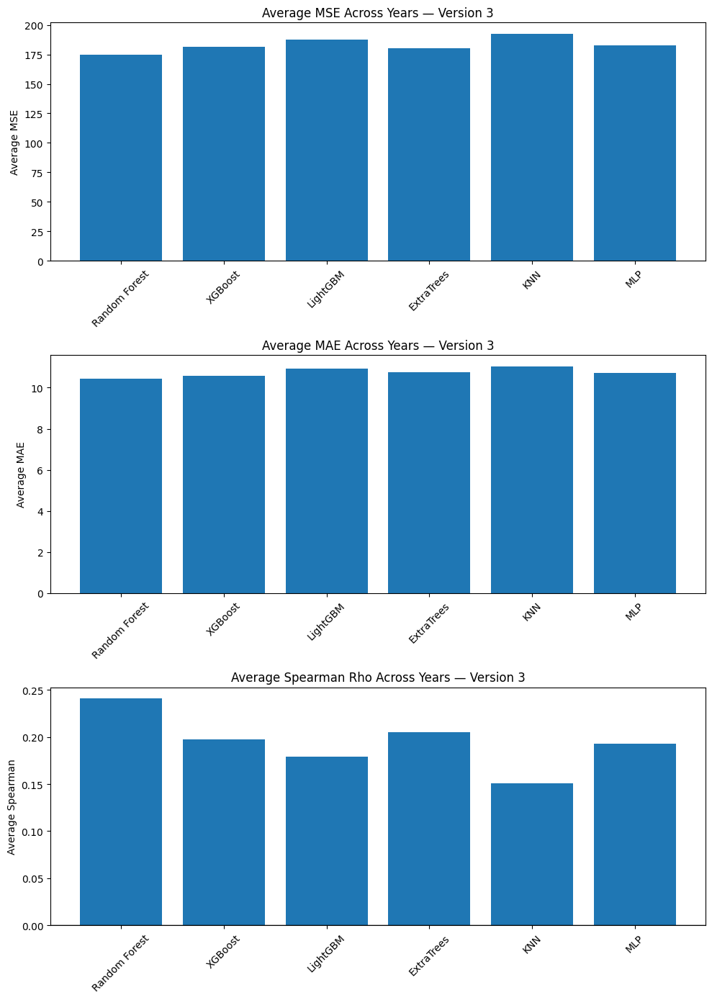

In [ ]:
for version_name in summary_df["Version"].unique():
    temp = summary_df[summary_df["Version"] == version_name]

    fig, axes = plt.subplots(3, 1, figsize=(10, 14))

    axes[0].bar(temp["Model"], temp["Avg_MSE"])
    axes[0].set_title(f"Average MSE Across Years — {version_name}")
    axes[0].set_ylabel("Average MSE")
    axes[0].tick_params(axis='x', rotation=45)

    axes[1].bar(temp["Model"], temp["Avg_MAE"])
    axes[1].set_title(f"Average MAE Across Years — {version_name}")
    axes[1].set_ylabel("Average MAE")
    axes[1].tick_params(axis='x', rotation=45)

    axes[2].bar(temp["Model"], temp["Avg_Spearman"])
    axes[2].set_title(f"Average Spearman Rho Across Years — {version_name}")
    axes[2].set_ylabel("Average Spearman")
    axes[2].tick_params(axis='x', rotation=45)
    axes[2].axhline(y=0, color="black", alpha=0.2)

    plt.tight_layout()
    plt.show()

In [ ]:
# Build a "best model per pass" summary using existing version_results dict

best_per_pass_rows = []

for version_name, model_dict in version_results.items():
    # ---- Model averages for this pass/version ----
    model_summary = []
    for model_name, df in model_dict.items():
        model_summary.append({
            "Model": model_name,
            "Avg_MSE": df["MSE_Model"].mean(),
            "Avg_MAE": df["MAE_Model"].mean(),
            "Avg_Spearman": df["Spearman_Model"].mean()
        })

    model_summary_df = pd.DataFrame(model_summary)

    # ---- Pick the best model for this pass ----
    # Primary criterion: lowest Avg_MSE
    # Tie-breakers: lowest Avg_MAE, then highest Avg_Spearman
    best_model_row = model_summary_df.sort_values(
        by=["Avg_MSE", "Avg_MAE", "Avg_Spearman"],
        ascending=[True, True, False]
    ).iloc[0]

    # ---- GM baseline for this pass/version ----
    # GM scores are the same across models, so pull from the first dataframe
    gm_df = list(model_dict.values())[0]

    best_per_pass_rows.append({
        "Pass": version_name,
        "Best_Model": best_model_row["Model"],
        "Best_Model_MSE": best_model_row["Avg_MSE"],
        "GM_MSE": gm_df["MSE_GM"].mean(),
        "Best_Model_MAE": best_model_row["Avg_MAE"],
        "GM_MAE": gm_df["MAE_GM"].mean(),
        "Best_Model_Spearman": best_model_row["Avg_Spearman"],
        "GM_Spearman": gm_df["Spearman_GM"].mean()
    })

best_per_pass_table = pd.DataFrame(best_per_pass_rows)

# Round for cleaner display
best_per_pass_table = best_per_pass_table.round({
    "Best_Model_MSE": 3,
    "GM_MSE": 3,
    "Best_Model_MAE": 3,
    "GM_MAE": 3,
    "Best_Model_Spearman": 3,
    "GM_Spearman": 3
})

display(best_per_pass_table)

,Pass,Best_Model,Best_Model_MSE,GM_MSE,Best_Model_MAE,GM_MAE,Best_Model_Spearman,GM_Spearman
0,Version 1,Random Forest,174.458,156.578,10.392,9.721,0.222,0.314
1,Version 2,ExtraTrees,179.452,151.264,10.658,9.582,0.216,0.333
2,Version 3,Random Forest,174.817,150.557,10.427,9.554,0.241,0.336
